In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_112992/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
# IMPORT
import numpy as np
import numpy.ma as ma
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
from netCDF4 import Dataset
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import xarray as xr
import glob
from datetime import datetime, timedelta
from numba import jit
import seaborn as sns


@jit()
def rms(true,prediction):
    return np.sqrt(np.nanmean((prediction-true)**2))

@jit()
def mean_error(true,prediction):
    return np.nanmean((prediction-true))

@jit()
def rms_tendency(variable,hours):
    variable_tendency = np.zeros((hours))
    variable = np.exp(variable) * 1000.0
    for i in range(hours):
        variable_tendency[i] = np.sqrt(np.mean((variable[i+1] - variable[i])**2.0))
    return variable_tendency

def latituded_weighted_rmse(true,prediction,lats):
    diff = prediction-true
#     print(diff[0][0])
    weights = np.cos(np.deg2rad(lats))
#     print(weights[0])
    weights2d = np.zeros(np.shape(diff))
    diff_squared = diff**2.0
    #weights = np.ones((10,96))
    weights2d = np.tile(weights,(96,1))
    weights2d = np.transpose(weights2d)
    masked = np.ma.MaskedArray(diff_squared, mask=np.isnan(diff_squared))
    weighted_average = np.ma.average(masked,weights=weights2d)
    return np.sqrt(weighted_average)

def latituded_weighted_mean_error(true,prediction,lats):
    diff = prediction-true
#     print(diff[0])
    weights = np.cos(np.deg2rad(lats))
#     print(weights[0])
    weights2d = np.zeros(np.shape(diff))
    diff_squared = diff
    #weights = np.ones((10,96))
    weights2d = np.tile(weights,(96,1))
    weights2d = np.transpose(weights2d)
#     print(weights2d)
    masked = np.ma.MaskedArray(diff_squared, mask=np.isnan(diff_squared))
#     print(masked[0])
    weighted_average = np.ma.average(masked,weights=weights2d)
#     print(weighted_average)
    return weighted_average


In [8]:
## MAIN SCRIPT
## **** CHANGE FILES AND DATES HERE

def rmse_time_series_plot_and_maps(level_in_speedy,variable_speedy,input_point): 
    # Define: Initial FILES, dates, Variable, and Level desired

#     analysis_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/40member_speedy_covar1_3_20110101_20120901/mean.nc'
#     analysis_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/speedy_cov_1_3_40MEM_individual_ens_member_20110101_20110601/mean_output/out.nc'
#     analysis_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/40member_speedy_covar1_3_20110101_20120901/mean.nc'

    analysis_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/speedy_cov_1_3_40MEM_individual_ens_member_20110101_20110601/mean_output/out.nc'
    gues_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/speedy_cov_1_3_40MEM_individual_ens_member_20110101_20110601/mean_output_gues/out.nc'

    '''
    
    ANAL and GUES
    
    '''
    ### ERA5  
    analysis_file = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/ERA5_1_3_6hr_timestep_1_24_24_20110101_20120101/mean_output/out.nc'
    gues_file = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/ERA5_1_3_6hr_timestep_1_24_24_20110101_20120101/mean_output_gues/out.nc'

    spread_file_ERA5 = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/ERA5_1_3_6hr_timestep_1_24_24_20110101_20120101/sprd_output/out.nc'
    
    
    spread_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/speedy_cov_1_3_40MEM_individual_ens_member_20110101_20110601/sprd_output/out.nc'
#     spread_file_speedy = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/40member_speedy_covar1_3_20110101_20120901/sprd.nc' 
    
    # SPREAD FILES
    ds_spread_ERA5 = xr.open_dataset(spread_file_ERA5)
    ds_spread_speedy = xr.open_dataset(spread_file_speedy)
    

    start_year = 2011
    end_year = 2011

    startdate = datetime(2011,1,1,0)
    enddate = datetime(2011,6,1,0)
    time_slice = slice(startdate,enddate)

    #level = 0.95 #0.2#0.95#0.51
    #level_era = 7 #2#7 #4
    
    level = level_in_speedy
    if level_in_speedy == .95:
        level_in_era = 7
    if level_in_speedy == .2:
        level_in_era = 2
    level_era = level_in_era

    var_da = variable_speedy
    if variable_speedy == 'q':
        variable_era = 'Specific_Humidity'
    if variable_speedy == 't':
        variable_era = 'Temperature'
    if variable_speedy == 'v':
        variable_era = 'V-wind'
    if variable_speedy == 'u':
        variable_era = 'U-wind'
#     var_era = variable_era
    print(variable_era)
    var_era = variable_era

    #### points = ['ocean_west_of_mexico','land_mexico','ocean_west_of_africa','land_africa','persian_gulf']

    points_on_speedy_grid = {
    'ocean_west_of_mexico': (66, 27),  #66 , 27 (it was 65,29)
    'land_mexico': (71, 27), # 71, 27 (it was 71,29)
    'ocean_west_of_africa': (0, 20), # 0, 20 
    'land_africa': (5, 20), # 5,20 (it was 4,20 i think)
    'persian_gulf': (13, 30),# 13, 30 it was (14,31)
    'gulf_of_alaska': (55,37)} 

    point = input_point  
    
    if input_point in points_on_speedy_grid:
        i_point, j_point = points_on_speedy_grid[point]
        print('point selected was: ',input_point)
        print("Coordinates:", i_point, j_point)
    else:
        print("Point not found")


    #var_era = 'V-wind'#'Specific_Humidity'#'Temperature' #'V-wind'
    #var_da =  'v'#'q'#'t'#'v'
    print('you selected for variable =',var_era)
    print('at level =',level)
    timestep_6hrly = 6
    
    # Calculate the number of timesteps for the enddate because stupid ERA5 dataset cannot use length
    
    num_timesteps = int((enddate - startdate).days * 24 / 6) + 1 # 6-hour timestep
    print('number of timesteps i found.. ',num_timesteps)
    # create empty list to store indiviudal datasets
    era5sets = []
    print('made it to the for loop...')

    # LOAD DATA HERE 
    print('LOADING DATA...')

    # loop over the range of years and open each ds
    for year in range(start_year, end_year + 1):
        nature_file = f'/skydata2/troyarcomano/ERA_5/{year}/era_5_y{year}_regridded_mpi_fixed_var.nc'
        # only load var_era selected and only load level_era selected from above
        ds_nature = xr.open_dataset(nature_file)[var_era].sel(Sigma_Level=level_era)
        # Read in every 6th timestep
        ds_nature = ds_nature.isel(Timestep=slice(None, None, timestep_6hrly))
        era5sets.append(ds_nature)
    
    print('Now its concatinating them all together...')

    ds_nature = xr.concat(era5sets, dim = 'Timestep')
    ds_nature = ds_nature.sortby('Timestep')
    print('Done concat and sortby Timestep...')
    
    ds_nature = ds_nature.isel(Timestep = slice(0,num_timesteps))


    ds_analysis_mean = xr.open_dataset(analysis_file)[var_da].sel(lev=level,time=time_slice)
    ds_analysis_mean_speedy = xr.open_dataset(analysis_file_speedy)[var_da].sel(lev=level,time=time_slice)
    
    
    #### GUESS FILES HERE
    ds_gues_mean = xr.open_dataset(gues_file)[var_da].sel(lev=level,time=time_slice)
    ds_gues_mean_speedy = xr.open_dataset(gues_file_speedy)[var_da].sel(lev=level,time=time_slice)
    
    #####
    

    temp_500_analysis = ds_analysis_mean
    # temp_500_analysis = ds_analysis_mean[var_da].sel(lev=level).values
    temp_500_analysis_speedy = ds_analysis_mean_speedy
    # temp_500_analysis_speedy = ds_analysis_mean_speedy[var_da].sel(lev=level,time=time_slice).values
    
    temp_500_nature = ds_nature.values
    temp_500_spread_era5 = ds_spread_ERA5[var_da].sel(lev=level).values
    temp_500_spread_speedy = ds_spread_speedy[var_da].sel(lev=level).values

    print('era5 shape = ',np.shape(ds_nature))
    print('speedy shape = ',np.shape(temp_500_analysis_speedy))
    print('hybrid shape = ',np.shape(temp_500_analysis))

    #find smallest index value to set that as the "length"
    speedy_index = temp_500_analysis_speedy.shape[0]
    print('speedy_index ', speedy_index)
    nature_index = temp_500_nature.shape[0]
    print('nature_index ', nature_index)
    hybrid_index = temp_500_analysis.shape[0]
    print('hybrid_index ', hybrid_index)
    
    smallest_index = min(speedy_index,nature_index,hybrid_index)

    if smallest_index == speedy_index:
        length = speedy_index #- 1
    elif smallest_index == nature_index:
        length = nature_index
    else:
        length = hybrid_index
    print('the smallest length is',length)

    #ps_nature = ds_nature['logp'].values
    #ps_nature = 1000.0 * np.exp(ps_nature)
    #ps_analysis = ds_analysis_mean['ps'].values/100.0
    
    
    
    
    
    
    
    xgrid = 96
    ygrid = 48
    #length = 365*4*2 #1952-7 # 240 for 3 months  #1450 ##338 #160#64#177#1400#455

    analysis_rmse = np.zeros((length))
    analysis_rmse_speedy = np.zeros((length))
    global_average_ensemble_spread_era5 = np.zeros((length))
    global_average_ensemble_spread_speedy = np.zeros((length))
    #ps_rmse = np.zeros((length))
    
    gues_rmse = np.zeros((length))
    gues_rmse_speedy = np.zeros((length))

    analysis_error = np.zeros((length,ygrid,xgrid))
    analysis_error_speedy = np.zeros((length,ygrid,xgrid))
    
    #point
    analysis_rmse_point = np.zeros((length))
    analysis_rmse_speedy_point = np.zeros((length))
    gues_rmse_point = np.zeros((length))
    gues_rmse_speedy_point = np.zeros((length))
    
    
    print(np.shape(analysis_error))
    print(np.shape(analysis_error_speedy))

    print('Now its calculating analysis RMSE...')
    lats = ds_nature.Lat
    
    # need j_point and i_point defined
    # i is timestep index
    
    for i in range(length):
        
        #global average
        analysis_rmse[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],temp_500_analysis[i,:,:],lats)
        analysis_rmse_speedy[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],temp_500_analysis_speedy[i,:,:],lats)
        gues_rmse[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_gues_mean[i,:,:],lats)
        gues_rmse_speedy[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_gues_mean_speedy[i,:,:],lats)
        
        # point rms
        analysis_rmse_point[i] = mean_error(temp_500_nature[i,j_point,i_point],temp_500_analysis[i,j_point,i_point])
        analysis_rmse_speedy_point[i] = mean_error(temp_500_nature[i,j_point,i_point],temp_500_analysis_speedy[i,j_point,i_point])
        gues_rmse_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_gues_mean[i,j_point,i_point])
        gues_rmse_speedy_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_gues_mean_speedy[i,j_point,i_point])
        
        
        #ps_rmse[i] = rms(ps_nature[i*6,:,:],ps_analysis[i,:,:])
#         analysis_error[i,:,:] = temp_500_analysis[i,:,:] - temp_500_nature[i,:,:]
#         analysis_error_speedy[i,:,:] = temp_500_analysis_speedy[i,:,:] - temp_500_nature[i,:,:]
        
#         global_average_ensemble_spread_era5[i] = np.average(temp_500_spread_era5[i,:,:])
#         global_average_ensemble_spread_speedy[i] = np.average(temp_500_spread_speedy[i,:,:])

    # print('mean analysis_rmse = ',analysis_rmse)

    print('DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..')

    # FOR DEALING WITH HOURLY RES ERA5 REANAL (((i*6)))

    # for i in range(length):
    #     analysis_rmse[i] = latituded_weighted_rmse(temp_500_nature[i*6,:,:],temp_500_analysis[i,:,:],lats)
    #     analysis_rmse_speedy[i] = latituded_weighted_rmse(temp_500_nature[i*6,:,:],temp_500_analysis_speedy[i,:,:],lats)
    #     #ps_rmse[i] = rms(ps_nature[i*6,:,:],ps_analysis[i,:,:])
    #     analysis_error[i,:,:] = temp_500_analysis[i,:,:] - temp_500_nature[i*6,:,:]
    #     analysis_error_speedy[i,:,:] = temp_500_analysis_speedy[i,:,:] - temp_500_nature[i*6,:,:]
    #     #global_average_ensemble_spread[i] = np.average(temp_500_spread[i,:,:])
    #print('Done.')  
    
    ############################
    # LOAD TROYS MEAN ANAL

    # Define the base path for the files
    # base_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/40member_hybrid_20110101_2011052906/anal'
    # base_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/era5_28_yr_trained_weights/'

    ### ERA 5 crash test
#     base_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/troy_test_speedy_trained_12monthrun/'
#     troy_anal_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/troy_test_speedy_trained_12monthrun/mean_output/out.nc'
    ### ERA5 1 year run worked path
#     base_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/ERA5_weights_sourcecodeupdated_1_20_24/'
    
    #### HYBRID NEW 1_3_1_3
    hybrid_base_path = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/hybrid_1_3_1_3_original_weights_20110101_20120101/'
    hybrid_base_path_1_5 = '/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/uniform_letkf_anal/hybrid_1_3_1_5_original_weights_20110101_20111105/'
    
    
    # Define the variable name, level, and time slice
    start_year = 2011
    end_year = 2011

    # startdate = datetime(2011,1,1,0)
    # enddate = datetime(2011,6,1,0)
    time_slice = slice(startdate,enddate)

    # level = 0.95 #0.2#0.95#0.51
    # level_era = 7 #2#7 #4

    # var_era = 'Temperature'#'Specific_Humidity'#'Temperature' #'V-wind'
    # var_da =  't'#'q'#'t'#'v'
    print('you selected for variable =',var_era)
    print('at level =',level)
    
    ## ADDING MEAN of Hybrid
    path_mean_anal_hybrid_retest = hybrid_base_path + 'mean_output/out.nc'
    ds_mean_anal_hybrid_retest_1_3_1_3 = xr.open_dataset(path_mean_anal_hybrid_retest)[var_da].sel(lev=level, time=time_slice)
    ## ADD GUES
    path_mean_gues_hybrid_retest = hybrid_base_path + 'mean_output_gues/out.nc'
    ds_mean_gues_hybrid_retest_1_3_1_3 = xr.open_dataset(path_mean_gues_hybrid_retest)[var_da].sel(lev=level, time=time_slice)
    
    
    ## ADD MEAN AND GUES OF 1.5 Hybrid
    path_mean_anal_hybrid_retest_1_5 = hybrid_base_path_1_5 + 'mean_output/out.nc'
    ds_mean_anal_hybrid_retest_1_3_1_5 = xr.open_dataset(path_mean_anal_hybrid_retest_1_5)[var_da].sel(lev=level, time=time_slice)
    path_mean_gues_hybrid_retest_1_5 = hybrid_base_path_1_5 + 'mean_output_gues/out.nc'
    ds_mean_gues_hybrid_retest_1_3_1_5 = xr.open_dataset(path_mean_gues_hybrid_retest_1_5)[var_da].sel(lev=level, time=time_slice)
    
    
    # SPREAD OF HYBRID
    spread_file_hybrid = hybrid_base_path + 'sprd_output/out.nc'
    ds_spread_hybrid = xr.open_dataset(spread_file_hybrid)
    temp_500_spread_hybrid = ds_spread_hybrid[var_da].sel(lev=level).values
    global_average_ensemble_spread_hybrid = np.zeros((length))
    
#     # Create an empty list to store the datasets
#     ds_list = []

#     # ens member list
#     ens_member_list = range(1,40+1)
# #     print("opening all files...")
#     # Loop through the member numbers and read in the corresponding files
#     for member_number in ens_member_list:
#         file_path = f'{base_path}/{member_number:03d}_output/out.nc'
#         # file_path = f'{base_path}/{member_number:03d}_output/{member_number:03d}.nc'
#         ds = xr.open_dataset(file_path)[var_da].sel(lev=level, time=time_slice)
#         ds_list.append(ds)
#     print('shape test =', np.shape(ds_list))
    
    
    
#     ds_anal_troy = xr.open_dataset(troy_anal_path)[var_da].sel(lev=level, time=time_slice)
#     print('shape test =', np.shape(ds_anal_troy))
    
    # print('ds_list[0] =',ds_list[0])

    # Assign each element in ds_list to be called ds_member_{i}
    # for i, ds in enumerate(ds_list, start=1):
    #     globals()[f'ds_member_{i}'] = ds

    # print(ds_member_1) 

    lats = ds_nature.Lat

    # analysis_error is for maps, see its a 3d array, 
    # MAKING analysis_rmse now

    print('MAKING zeros arrays..')
#     quantity_of_ens_members = 40
#     analysis_rmse_object = np.zeros((quantity_of_ens_members, length))
    
#     anal_rmse_troy = np.zeros((length))
#     anal_error_troy = np.zeros((length,ygrid,xgrid))
    anal_mean_error_hybrid_1_3_1_3 = np.zeros((length,ygrid,xgrid))
    anal_mean_rmse_hybrid_1_3_1_3 = np.zeros((length))
    gues_mean_rmse_hybrid_1_3_1_3 = np.zeros((length))
    anal_mean_rmse_hybrid_1_3_1_3_point = np.zeros((length))
    gues_mean_rmse_hybrid_1_3_1_3_point = np.zeros((length))
    #add 1.5
    anal_mean_error_hybrid_1_3_1_5 = np.zeros((length,ygrid,xgrid))
    anal_mean_rmse_hybrid_1_3_1_5 = np.zeros((length))
    gues_mean_rmse_hybrid_1_3_1_5 = np.zeros((length))
    anal_mean_rmse_hybrid_1_3_1_5_point = np.zeros((length))
    gues_mean_rmse_hybrid_1_3_1_5_point = np.zeros((length))
    
    # check shape, yes they are equal and vibing
    # print('new = ',np.shape(analysis_rmse_object[0]))
    # print('old = ', np.shape(analysis_rmse_1))

#     print('looping through each ERA5 ens_member at every timestep..')
#     counter = 0
#     for member_number in range(0,40):
#         # loop through each timestep
#         counter = counter + 1
#         print('MEM counter = ',counter)
#         for l in range(length):
#     #     for l in range(length):
#             analysis_rmse_object[member_number,l] = latituded_weighted_rmse(temp_500_nature[l,:,:],ds_list[member_number][l,:,:],lats)
    
        
    ##### and calc for mem 1 with length == 3:
    # analysis_rmse_mem1 = latituded_weighted_rmse(temp_500_nature[3,:,:],ds_list[1][3,:,:],lats)
    # print(analysis_rmse_mem1)
    #####

    # print('analysis_rmse_object[0] =',analysis_rmse_object[0])
    # print('analysis_rmse_object[39] =',analysis_rmse_object[39])    

    print('Done with ensemble analysis (if any).')
    
    #########################################################
    # MAKE MAP FROM ABOVE 

    ''' 24(below) instead of 28 to cut transient event (ML spin up) out in first few weeks '''
    ####### WHICH AVGERAGE ERROR DO YOU WANT?? I want the analysis error of the mean ERA5
    # analysis_error
#     averaged_error = np.average(abs(anal_mean_error_hybrid_1_3_1_3[24::,:,:]),axis=0)
# NO MAPS
#     averaged_error = np.average(abs(analysis_error[24::,:,:]),axis=0)
#     averaged_error_speedy = np.average(abs(analysis_error_speedy[24::,:,:]),axis=0)

#     lat = ds_analysis_mean.lat.values
#     lon = ds_analysis_mean.lon.values

#     lons2d, lats2d = np.meshgrid(lon,lat)

#     print('Now plotting and meshing...')

#     ''' Multiply averaged_error by 1000 for spec_humid only'''

    if var_era == 'Temperature':
        units='(K)'
    if var_era == 'Specific_Humidity':
        units='(g/kg)'
    if var_era == 'V-wind':
        units='(m/s)'
    if var_era == 'U-wind':
        units='(m/s)'
    print(units)
    if level == .95:
        title_level = 'Low Level '
    if level == .2:
        title_level = '200 hPa '

    if var_era == 'Specific_Humidity':
        title_var_era = 'Specific Humidity'
    if var_era == 'V-wind':
        title_var_era = "Meridional Wind"
    if var_era == 'Temperature':
        title_var_era = 'Temperature'
    if var_era == 'U-wind':
        title_var_era = 'Zonal Wind'
    print(title_var_era)

#     if level == .95 and var_era == 'Temperature':
#         adapted_range = np.arange(0,5.05,.05)
#         adapted_difference_range = np.arange(-5,5,.05)

#     if level == .2 and var_era == 'Temperature':
# #         adapted_range = np.arange(0,.1,.001)
# #         adapted_difference_range = np.arange(-.05,.05,.001)
#         adapted_range = np.arange(0,5.05,.05)
#         adapted_difference_range = np.arange(-5,5,.05)

#     if level == .95 and var_era == 'Specific_Humidity':
#         adapted_range = np.arange(0,3,.05)
#         adapted_difference_range = np.arange(-2,2,.001)

#     if level == .2 and var_era == 'Specific_Humidity':
#         adapted_range = np.arange(0,.1,.001)
#         adapted_difference_range = np.arange(-.05,.05,.001)

#     if level == .2 and var_era == 'V-wind':
#         adapted_range = np.arange(0,10.05,.05)
#         adapted_difference_range = np.arange(-2,2.1,.05)
#     if level == .95 and var_era == 'V-wind':
#         adapted_range = np.arange(0,10.05,.05)
#         adapted_difference_range = np.arange(-2,2.1,.05)
#     if level == .95 and var_era == 'U-wind':
#         adapted_range = np.arange(0,10.05,.05)
#         adapted_difference_range = np.arange(-2,2.1,.05)
#     if level == .2 and var_era == 'U-wind':
#         adapted_range = np.arange(0,10.05,.05)
#         adapted_difference_range = np.arange(-2,2.1,.05)
    
    fs = 16
    
#     ### ADAPT TO 2 small on top 1 big plot below
#     # PLOT 1

#     fig = plt.figure(figsize=(10,8))
    
#     fig.suptitle('LETKF Analysis Error\n' + title_level +  title_var_era + '\nJan 1, 2011 to Jan 1, 2012',fontsize=fs)

#     gs = fig.add_gridspec(2,2, width_ratios=[1, 1], height_ratios=[1.3, 3])
#     ax1 = fig.add_subplot(gs[0, 0],projection=ccrs.PlateCarree())
#     ''' ax1 ===>  Makes map of hybrid letkf analysis error  '''
# #     ax1 = plt.subplot(311,projection=ccrs.PlateCarree())
#     ax1.coastlines()
    
#     # Mulitply 1000 for spec humid
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error*1000, coord=lon)
#     else: 
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error, coord=lon)
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)
        
#     cf = ax1.contourf(lons2d, lats2d,cyclic_data,levels=adapted_range,extend='both')
# #     plt.colorbar(cf,label=units,fraction=0.046, pad=0.04)

# #     plt.title('LETKF Analysis Error\n' + title_level +  title_var_era)
#     ax1.set_title('ERA5 trained Hybrid',fontsize=fs) #1.3

#     '''ax2 ===>  makes plot of speedy letkf analysis error '''
# #     ax2 = plt.subplot(312,projection=ccrs.PlateCarree())
#     ax2 = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())
#     ax2.coastlines()
    
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error_speedy*1000, coord=lon)
#     else:
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error_speedy, coord=lon)
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)

#     cf = ax2.contourf(lons2d, lats2d,cyclic_data,levels=adapted_range,extend='both')
# #     plt.colorbar(cf,label=units,fraction=0.02, pad=0.04)
#     colorbar = plt.colorbar(cf,fraction=0.02, pad=0.04)
#     colorbar
#     colorbar.ax.tick_params(labelsize = 14)
#     colorbar.set_label(units,fontsize=14)
#     ax2.set_title('SPEEDY',fontsize=fs)

#     diff = averaged_error - averaged_error_speedy
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(diff*1000, coord=lon)
#     else:
#         cyclic_data, cyclic_lons = add_cyclic_point(diff, coord=lon)
    
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)

#     '''ax3 ==> Makes map of difference of hybrid and speedy '''
#     ax3 = fig.add_subplot(gs[1, :],projection=ccrs.PlateCarree())
# #     ax3 = plt.subplot(313,projection=ccrs.PlateCarree())
#     ax3.coastlines()
#     ax3.set_title('Difference (Hybrid - SPEEDY)',fontsize=fs)
    
#     # high_level_difference_range = np.arange(-.05,.05,.001)
#     # low_level_difference_range = np.arange(-5,5,.05)

#     cf = ax3.contourf(lons2d, lats2d,cyclic_data,levels=adapted_difference_range,extend='both',cmap='seismic')
#     colorbar2 = plt.colorbar(cf,fraction=0.02, pad=0.04)
#     colorbar2
#     colorbar2.ax.tick_params(labelsize= 14)
#     colorbar2.set_label(units,fontsize = 14)
#     plt.tight_layout(pad=1.0)
# #     plt.colorbar(cf,label=units,fraction=0.046, pad=0.04)
    
#     # Generate a filename based on level and variable_name level_in_speedy,variable_speedy
#     filenameera5 = f"Map_of_level_{level_in_speedy}_variable_{variable_speedy}_ERA5.png"
#     print(filenameera5)
#     # Save the figure with the generated filename
#     plt.savefig('Maps_Speedy_trained_Hybrid_ERA5_trained_Hybrid/' + filenameera5,dpi=1200)
#     plt.show()
    
#     #####################################
    print('looping through hybrid 1.3,1.3 ..')
    for i in range(length):
#         anal_error_troy[i,:,:] = ds_anal_troy[i,:,:] - temp_500_nature[i,:,:]
#         anal_rmse_troy[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],ds_anal_troy[i,:,:],lats)

#         anal_mean_error_hybrid_1_3_1_3[i,:,:] = ds_mean_anal_hybrid_retest_1_3_1_3[i,:,:] - temp_500_nature[i,:,:]
        anal_mean_rmse_hybrid_1_3_1_3[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_mean_anal_hybrid_retest_1_3_1_3[i,:,:],lats)
        gues_mean_rmse_hybrid_1_3_1_3[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_mean_gues_hybrid_retest_1_3_1_3[i,:,:],lats)
        
        anal_mean_rmse_hybrid_1_3_1_3_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point])
        gues_mean_rmse_hybrid_1_3_1_3_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point])
        
        # Add hybrid 1.5
        anal_mean_rmse_hybrid_1_3_1_5[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_mean_anal_hybrid_retest_1_3_1_5[i,:,:],lats)
        gues_mean_rmse_hybrid_1_3_1_5[i] = latituded_weighted_mean_error(temp_500_nature[i,:,:],ds_mean_gues_hybrid_retest_1_3_1_5[i,:,:],lats)
        
        anal_mean_rmse_hybrid_1_3_1_5_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_mean_anal_hybrid_retest_1_3_1_5[i,j_point,i_point])
        gues_mean_rmse_hybrid_1_3_1_5_point[i] = mean_error(temp_500_nature[i,j_point,i_point],ds_mean_gues_hybrid_retest_1_3_1_5[i,j_point,i_point])
        
#         global_average_ensemble_spread_hybrid[i] = np.average(temp_500_spread_hybrid[i,:,:])
        
# ### 2nd MAP

#     averaged_error = np.average(abs(anal_mean_error_hybrid_1_3_1_3[24::,:,:]),axis=0)
#     averaged_error_speedy = np.average(abs(analysis_error_speedy[24::,:,:]),axis=0)


#     fig = plt.figure(figsize=(10,8))

#     fig.suptitle('LETKF Analysis Error\n' + title_level +  title_var_era + '\nJan 1, 2011 to Jan 1, 2012',fontsize =fs)

#     gs = fig.add_gridspec(2,2, width_ratios=[1, 1], height_ratios=[1.3, 3])
#     ax1 = fig.add_subplot(gs[0, 0],projection=ccrs.PlateCarree())
#     ''' ax1 ===>  Makes map of hybrid letkf analysis error  '''
# #     ax1 = plt.subplot(311,projection=ccrs.PlateCarree())
#     ax1.coastlines()
    
#     # Mulitply 1000 for spec humid
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error*1000, coord=lon)
#     else: 
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error, coord=lon)
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)
        
#     cf = ax1.contourf(lons2d, lats2d,cyclic_data,levels=adapted_range,extend='both')
# #     plt.colorbar(cf,label=units,fraction=0.046, pad=0.04)

# #     plt.title('LETKF Analysis Error\n' + title_level +  title_var_era)
#     ax1.set_title('Speedy trained Hybrid',fontsize =fs) #1.3

#     '''ax2 ===>  makes plot of speedy letkf analysis error '''
# #     ax2 = plt.subplot(312,projection=ccrs.PlateCarree())
#     ax2 = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())
#     ax2.coastlines()
    
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error_speedy*1000, coord=lon)
#     else:
#         cyclic_data, cyclic_lons = add_cyclic_point(averaged_error_speedy, coord=lon)
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)

#     cf = ax2.contourf(lons2d, lats2d,cyclic_data,levels=adapted_range,extend='both')
#     colorbar = plt.colorbar(cf,fraction=0.02, pad=0.04)
#     colorbar
#     colorbar.ax.tick_params(labelsize = 14)
#     colorbar.set_label(units,fontsize=14)
# #     plt.colorbar(cf,label=units,fraction=0.046, pad=0.04)
#     ax2.set_title('SPEEDY',fontsize =fs)

#     diff = averaged_error - averaged_error_speedy
#     if var_era == 'Specific_Humidity':
#         cyclic_data, cyclic_lons = add_cyclic_point(diff*1000, coord=lon)
#     else:
#         cyclic_data, cyclic_lons = add_cyclic_point(diff, coord=lon)
    
#     lons2d,lats2d = np.meshgrid(cyclic_lons,lat)

#     '''ax3 ==> Makes map of difference of hybrid and speedy '''
#     ax3 = fig.add_subplot(gs[1, :],projection=ccrs.PlateCarree())
# #     ax3 = plt.subplot(313,projection=ccrs.PlateCarree())
#     ax3.coastlines()
#     ax3.set_title('Difference (Hybrid - SPEEDY)',fontsize =fs)
    
#     # high_level_difference_range = np.arange(-.05,.05,.001)
#     # low_level_difference_range = np.arange(-5,5,.05)

#     cf = ax3.contourf(lons2d, lats2d,cyclic_data,levels=adapted_difference_range,extend='both',cmap='seismic')
#     colorbar2 = plt.colorbar(cf,fraction=0.02, pad=0.04)
#     colorbar2 
#     colorbar2.ax.tick_params(labelsize = 14)
#     colorbar2.set_label(units,fontsize=14)
    
#     plt.tight_layout(pad=1.0)
# #     plt.colorbar(cf,label=units,fraction=0.046, pad=0.04)
# #     plt.show()
    
#     # Generate a filename based on level and variable_name level_in_speedy,variable_speedy
#     filename_hybrid = f"Map_of_level_{level_in_speedy}_variable_{variable_speedy}_hybrid_speedy.png"
#     print(filename_hybrid)
#     # Save the figure with the generated filename
# #     plt.savefig('Maps_Speedy_trained_Hybrid_ERA5_trained_Hybrid/' + filename_hybrid,dpi=1200)
#     plt.show()


    
    # code for plot every ensemble member

    # MAKE TIME SERIES for each ensemble member
    
    x = np.arange(0,length)
    base = datetime(2011,1,1,0)

    plt.figure(figsize=(12,6))
    date_list = [base + timedelta(days=x/4) for x in range(length)]
    
    ### PLOT ENS MEMBERS 
    
    # make colors for 40 member ens
#     from matplotlib.colors import LinearSegmentedColormap
#     start_color = np.array([1.0, 0.8, 0.8])  # Light Red (RGB values)
#     end_color = np.array([0.5, 0.0, 0.0])   # Dark Red (RGB values)
#     # Create a colormap with 40 colors by linearly interpolating between start and end colors
#     cmap = LinearSegmentedColormap.from_list("custom_colormap", np.linspace(start_color, end_color, 40))
#     # Get a list of 40 different colors from the colormap
#     num_colors = 40
#     colors = [cmap(i / (num_colors - 1)) for i in range(num_colors)]

#     for each_member in range(0,40):
#         plt.plot(date_list,analysis_rmse_object[each_member],linewidth=.45,color=colors[each_member],label=each_member+1)
    # ALSO Average of MEAN LINE
    
    width = 1
    
    # 6 
    
#     anal_mean_rmse_hybrid_1_3_1_3 = np.zeros((length))
#     gues_mean_rmse_hybrid_1_3_1_3 = np.zeros((length))
#     anal_mean_rmse_hybrid_1_3_1_3_point = np.zeros((length))
#     gues_mean_rmse_hybrid_1_3_1_3_point = np.zeros((length))
   
#         analysis_rmse[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],temp_500_analysis[i,:,:],lats)
#         analysis_rmse_speedy[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],temp_500_analysis_speedy[i,:,:],lats)
#         gues_rmse[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],ds_gues_mean[i,:,:],lats)
#         gues_rmse_speedy[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],ds_gues_mean_speedy[i,:,:],lats)
        
#         # point rms
#         analysis_rmse_point[i] = rms(temp_500_nature[i,j_point,i_point],temp_500_analysis[i,j_point,i_point])
#         analysis_rmse_speedy_point[i] = rms(temp_500_nature[i,j_point,i_point],temp_500_analysis_speedy[i,j_point,i_point])
#         gues_rmse_point[i] = rms(temp_500_nature[i,j_point,i_point],ds_gues_mean[i,j_point,i_point])
#         gues_rmse_speedy_point[i] = rms(temp_500_nature[i,j_point,i_point],ds_gues_mean_speedy[i,j_point,i_point])
        
#         anal_mean_rmse_hybrid_1_3_1_3[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],ds_mean_anal_hybrid_retest_1_3_1_3[i,:,:],lats)
#         gues_mean_rmse_hybrid_1_3_1_3[i] = latituded_weighted_rmse(temp_500_nature[i,:,:],ds_mean_gues_hybrid_retest_1_3_1_3[i,:,:],lats)
        
#         anal_mean_rmse_hybrid_1_3_1_3_point[i] = rms(temp_500_nature[i,j_point,i_point],ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point])
#         gues_mean_rmse_hybrid_1_3_1_3_point[i] = rms(temp_500_nature[i,j_point,i_point],ds_mean_gues_hybrid_retest_1
    
    if var_era == 'Specific_Humidity':
        # convert (kg/kg) to (g/kg) 
        variables_to_multiply = [analysis_rmse, analysis_rmse_speedy,
                                 gues_rmse, gues_rmse_speedy, 
                                 analysis_rmse_point, analysis_rmse_speedy_point,
                                 gues_rmse_point, gues_rmse_speedy_point,
                                 anal_mean_rmse_hybrid_1_3_1_3, gues_mean_rmse_hybrid_1_3_1_3,
                                 anal_mean_rmse_hybrid_1_3_1_3_point, gues_mean_rmse_hybrid_1_3_1_3_point,
                                 anal_mean_rmse_hybrid_1_3_1_5, gues_mean_rmse_hybrid_1_3_1_5,
                                 anal_mean_rmse_hybrid_1_3_1_5_point, gues_mean_rmse_hybrid_1_3_1_5_point]
        
        variables_to_multiply = [variable * 1000 for variable in variables_to_multiply]
        (analysis_rmse, analysis_rmse_speedy,
         gues_rmse, gues_rmse_speedy, 
         analysis_rmse_point, analysis_rmse_speedy_point,
         gues_rmse_point, gues_rmse_speedy_point,
         anal_mean_rmse_hybrid_1_3_1_3, gues_mean_rmse_hybrid_1_3_1_3,
         anal_mean_rmse_hybrid_1_3_1_3_point, gues_mean_rmse_hybrid_1_3_1_3_point,
         anal_mean_rmse_hybrid_1_3_1_5, gues_mean_rmse_hybrid_1_3_1_5,
         anal_mean_rmse_hybrid_1_3_1_5_point, gues_mean_rmse_hybrid_1_3_1_5_point) = variables_to_multiply
        
    ### PLOT GLOBALLY AVERAGED RMSE 
    
#     plt.plot(date_list,anal_mean_rmse_hybrid_1_3_1_3,color='red',lw=width,label="Speedy trained Hybrid 1.3")
#     plt.axhline(y=np.average(anal_mean_rmse_hybrid_1_3_1_3[20::]),color='red',lw=width, linestyle='--',label="Average Speedy trained Hybrid 1.3")
    
#     plt.plot(date_list,gues_mean_rmse_hybrid_1_3_1_3,color='green',label='Speedy trained Hybrid BACKGROUND 1.3')
#     plt.axhline(y=np.average(gues_mean_rmse_hybrid_1_3_1_3[20::]),color='green',lw=width, linestyle='--',label="Average Speedy trained Hybrid BACKGROUND 1.3")

#     plt.plot(date_list,gues_rmse, color='purple',label='ERA5 trained Hybrid BACKGROUND')
#     plt.axhline(y=np.average(gues_rmse[20::]),color='purple',lw=width, linestyle='--',label="Average ERA5 trained Hybrid BACKGROUND")
    
#     plt.plot(date_list,gues_rmse_speedy,color = 'orange',label='SPEEDY BACKGROUND')
#     plt.axhline(y=np.average(gues_rmse_speedy[20::]),color='orange',lw=width, linestyle='--',label='Average SPEEDY BACKGROUND')
    
#     plt.plot(date_list,analysis_rmse_speedy,label='Speedy',linewidth=width,color='blue')    
#     plt.axhline(y=np.average(analysis_rmse_speedy[20::]), color='blue',lw=width, linestyle='--',label="Average Speedy")
    
#     plt.plot(date_list,analysis_rmse,label='ERA5 trained Hybrid',linewidth=width,color='black')
#     plt.axhline(y=np.average(analysis_rmse[20::]), color='black',lw=width, linestyle='--',label="Average ERA5 trained Hybrid")
    
#     plt.plot(date_list,anal_mean_rmse_hybrid_1_3_1_5,color='salmon',lw=width,label="Speedy trained Hybrid 1.5")
#     plt.axhline(y=np.average(anal_mean_rmse_hybrid_1_3_1_5[20::]),color='salmon',lw=width, linestyle='--',label="Average Speedy trained Hybrid 1.5")
    
#     plt.plot(date_list,gues_mean_rmse_hybrid_1_3_1_3,color='lightblue',label='Speedy trained Hybrid BACKGROUND 1.5')
#     plt.axhline(y=np.average(gues_mean_rmse_hybrid_1_3_1_3[20::]),color='lightblue',lw=width, linestyle='--',label="Average Speedy trained Hybrid BACKGROUND 1.5")

#     # FOR PLOT MEMBER 1
# #     plt.plot(date_list,analysis_rmse_object[0],linewidth=.45,color='green',label='MEM1 in GREEN')
# #     plt.axhline(y=np.average(analysis_rmse[20::]), color='r',lw=width, linestyle='--',label="Average RMSE 1st Iteration Hybrid 1.5,1.3")
# #     plt.axhline(y=np.average(analysis_rmse_speedy[20::]), color='b',lw=width, linestyle='--',label="Average RMSE SPEEDY 1.3")    
    
    
    
#     plt.title('LETKF Background and Analysis Mean Error\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    
#     plt.xlabel('Date',fontsize = fs)
#     plt.ylabel('Mean Error ' + units,fontsize = fs)
#     plt.xlim([startdate,enddate])
#     plt.show()
    
    
#     #########################################################################
    
#     x = np.arange(0,length)
#     base = datetime(2011,1,1,0)

#     plt.figure(figsize=(12,6))
#     date_list = [base + timedelta(days=x/4) for x in range(length)]
    
#     ### PLOT difference in input_point 
    
# #     diff_speedy_trained_hybrid = gues_mean_rmse_hybrid_1_3_1_3_point - anal_mean_rmse_hybrid_1_3_1_3_point
# #     diff_ERA5_trained_hybrid = gues_rmse_point - analysis_rmse_point
# #     diff_Speedy = gues_rmse_speedy_point - analysis_rmse_speedy_point
    
# #     #PLOT differences above
# #     plt.plot(date_list, diff_speedy_trained_hybrid, color = 'red', label='Diff of Speedy trained Hybrid')
# #     plt.axhline(y=np.average(diff_speedy_trained_hybrid[20::]),color='red',lw=width, linestyle='--',label="Average Diff of Speedy trained Hybrid")
    
# #     plt.plot(date_list, diff_ERA5_trained_hybrid, color = 'black',label='Diff of ERA5 trained Hybrid')
# #     plt.axhline(y=np.average(diff_ERA5_trained_hybrid[20::]),color='black',lw=width, linestyle='--',label="Average Diff of ERA5 trained Hybrid")
    
# #     plt.plot(date_list, diff_Speedy, color = 'blue',label='Diff of Speedy')
# #     plt.axhline(y=np.average(diff_Speedy[20::]),color='blue',lw=width, linestyle='--',label="Average Diff of Speedy")

# # #     plt.axhline(y=0,color='k',lw=0.5)
# #     plt.ylim(-0.00075,0.00075)


#     plt.plot(date_list,anal_mean_rmse_hybrid_1_3_1_3_point,color='red',lw=width,label="Speedy trained Hybrid" + ' ' + input_point)
#     plt.axhline(y=np.average(anal_mean_rmse_hybrid_1_3_1_3_point[20::]),color='red',lw=width, linestyle='--',label="Average Speedy trained Hybrid" + ' ' + input_point)
    
#     plt.plot(date_list,gues_mean_rmse_hybrid_1_3_1_3_point,color='green',label='Speedy trained Hybrid BACKGROUND' + ' ' + input_point)
#     plt.axhline(y=np.average(gues_mean_rmse_hybrid_1_3_1_3_point[20::]),color='green',lw=width, linestyle='--',label="Average Speedy trained Hybrid BACKGROUND" + ' ' + input_point)

#     plt.plot(date_list,gues_rmse_point, color='purple',label='ERA5 trained Hybrid BACKGROUND' + ' ' + input_point)
#     plt.axhline(y=np.average(gues_rmse_point[20::]),color='purple',lw=width, linestyle='--',label="Average ERA5 trained Hybrid BACKGROUND" + ' ' + input_point)
    
#     plt.plot(date_list,gues_rmse_speedy_point,color = 'orange',label='SPEEDY BACKGROUND' + ' ' + input_point)
#     plt.axhline(y=np.average(gues_rmse_speedy_point[20::]),color='orange',lw=width, linestyle='--',label='Average SPEEDY BACKGROUND' + ' ' + input_point)
    
#     plt.plot(date_list,analysis_rmse_speedy_point,label='Speedy' + ' ' + input_point,linewidth=width,color='blue')    
#     plt.axhline(y=np.average(analysis_rmse_speedy_point[20::]), color='blue',lw=width, linestyle='--',label="Average Speedy" + ' ' + input_point)
    
#     plt.plot(date_list,analysis_rmse_point,label='ERA5 trained Hybrid' + ' ' + input_point,linewidth=width,color='black')
#     plt.axhline(y=np.average(analysis_rmse_point[20::]), color='black',lw=width, linestyle='--',label="Average ERA5 trained Hybrid" + ' ' + input_point)
    
#     ## Add hybrid 1.5
#     plt.plot(date_list,anal_mean_rmse_hybrid_1_3_1_5_point,color='salmon',lw=width,label="Speedy trained Hybrid 1.5" + ' ' + input_point)
#     plt.axhline(y=np.average(anal_mean_rmse_hybrid_1_3_1_5_point[20::]),color='salmon',lw=width, linestyle='--',label="Average Speedy trained Hybrid 1.5" + ' ' + input_point)
    
#     plt.plot(date_list,gues_mean_rmse_hybrid_1_3_1_5_point,color='lightblue',label='Speedy trained Hybrid BACKGROUND 1.5' + ' ' + input_point)
#     plt.axhline(y=np.average(gues_mean_rmse_hybrid_1_3_1_5_point[20::]),color='lightblue',lw=width, linestyle='--',label="Average Speedy trained Hybrid BACKGROUND 1.5" + ' ' + input_point)
#     ##
    
#     plt.title('LETKF Background and Analysis Error\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    
#     plt.xlabel('Date',fontsize = fs)
#     plt.ylabel('Error ' + units,fontsize = fs)
    
    
# #     plt.xticks(fontsize=15)
# #     plt.yticks(fontsize=15)
#     plt.xlim([startdate,enddate])
# #     plt.ylim(0,0.003)
    
#     #####
# #     if level == .95 and var_era == 'Temperature':
# #         plt.ylim(1,3)
        
# #     if level == .2 and var_era == 'Temperature':
# #         plt.ylim(1,3)

# #     if level == .95 and var_era == 'Specific_Humidity':
# #         plt.ylim(.0005,.0021)

# #     if level == .2 and var_era == 'Specific_Humidity':
# #         plt.ylim(0,6e-5)

# #     if level == .2 and var_era == 'V-wind':
# #         plt.ylim(2.4,5.5)
        
# #     if level == .95 and var_era == 'V-wind':
# #         plt.ylim(1.75,3.75)
        
# #     if level == .95 and var_era == 'U-wind':
# #         plt.ylim(1.4,3.75)
        
# #     if level == .2 and var_era == 'U-wind':
# #         plt.ylim(2.4,6)
    
#     #####
# #     handles, labels = plt.get_legend_handles_labels()
# #     lgd = plt.legend(handles, labels, ncol=1,loc='center right', bbox_to_anchor=(1.7, 0.5),fontsize = 15)
# #     plt.legend(ncol=1,loc='center right', bbox_to_anchor(1.5,0.5),fontsize=15, bbox_inches='tight')
#     plt.legend(ncol=1,loc='center right', bbox_to_anchor=(1.65, 0.5))
# #     plt.legend()
#     plt.grid(color='grey', linestyle='--', linewidth=.5)
    
#     # Generate a filename based on level and variable_name level_in_speedy,variable_speedy
    
#     # Save the figure with the generated filename
# #     plt.tight_layout()
    
#     filename2 = f"Time_Series_of_level_{level_in_speedy}_variable_{variable_speedy}.png"
# #     plt.savefig('Time_series_Speedy_trained_Hybrid_ERA5_trained_Hybrid/'+filename2,dpi=1200)

# #     plt.savefig('Time_series_Speedy_trained_Hybrid_ERA5_trained_Hybrid/'+filename2, bbox_inches='tight')
#     plt.show()
    
    
# #     #SPREAD PLOT
# #     # code for plotting ens spread

# #     # MAKE TIME SERIES

# #     x = np.arange(0,length)

# #     base = datetime(2011,1,1,0)
# #     plt.figure(figsize=(12,6))
# #     date_list = [base + timedelta(days=x/4) for x in range(length)]
# #     plt.plot(date_list,global_average_ensemble_spread_hybrid,color='r',label='Speedy trained Hybrid 1.3,1.3 retrain') #cov-infl1.3
# #     plt.plot(date_list,global_average_ensemble_spread_speedy,color='b',label='SPEEDY-LETKF 1.3')
# #     plt.plot(date_list,global_average_ensemble_spread_era5, color='black',label ='ERA5 trained Hybrid 1.3' )
    
# #     # plt.axhline(y=np.average(analysis_rmse[20::]), color='r', linestyle='--',label="Average RMSE Hybrid 1.5,1.3")
# #     # plt.axhline(y=np.average(analysis_rmse_speedy[20::]), color='b', linestyle='--',label="Average RMSE SPEEDY 1.3")

# #     #plt.plot(date_list,global_average_ensemble_spread,label='Ensemble Spread')
# #     #plt.title('LETKF Analysis Error\n Low Level Specific Humidity')
# #     plt.title('LETKF Background Spread\n'+ title_level + title_var_era)
# #     #plt.title('Ensemble Spread\nModel Level 4 Temperature')
# #     plt.legend()
# #     plt.xlabel('Date')

# #     plt.ylabel('Ensemble Spread')
# # #     plt.xlim([datetime(2011,1, 1,0), datetime(2011, 6, 5,0)])
# # #     plt.ylim(0.16,.2)
# #     plt.show()

#     # Make plot with values 
#     # plot this list of guys
#     list_to_plot_values = [ds_mean_anal_hybrid_retest_1_3_1_3,ds_mean_gues_hybrid_retest_1_3_1_3,
#                            ds_analysis_mean, ds_gues_mean, ds_analysis_mean_speedy,
#                            ds_gues_mean_speedy, ds_nature,
#                            ds_mean_anal_hybrid_retest_1_3_1_5,ds_mean_gues_hybrid_retest_1_3_1_5]
#     color_list = ['red','green','black','purple','blue','orange','maroon','salmon','lightblue']
#     plt.figure(figsize=(12,6))
# #     for ds in list_to_plot_values:
# #         plt.plot(date_list,ds[:,j_point,i_point]*1000, color=color_list[ds], label=list_to_plot_values[ds])
# #     for idx, ds in enumerate(list_to_plot_values):
# #         plt.plot(date_list, ds[:, j_point, i_point] * 1000, color=color_list[idx], label=f"Dataset {idx+1}")
    
#     label_names = ['Speedy trained Hybrid 1.3 Analysis', 'Speedy trained Hybrid 1.3 Guess',
#                'ERA5 trained Hybrid Analysis', 'ERA5 trained Hybrid Guess', 'Speedy Analysis', 
#                    'Speedy Guess', 'Truth (ERA5)','Speedy trained Hybrid 1.5 Analysis', 'Speedy trained Hybrid 1.5 Guess']

#     for idx, ds in enumerate(list_to_plot_values):
#         plt.plot(date_list, ds[:, j_point, i_point] * 1000, color=color_list[idx], label=label_names[idx])
#         plt.axhline(y=np.average(ds[:,j_point,i_point])*1000,linestyle='--', color= color_list[idx], label=label_names[idx] + ' Average' )
#     plt.grid(color='grey', linestyle='--', linewidth=.5)
#     plt.legend()
#     plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
#     plt.legend(ncol=1,loc='center right', bbox_to_anchor=(1.4, 0.5))
#     plt.xlabel('Date',fontsize = fs)
#     plt.ylabel('Value' + units,fontsize = fs)
# #     plt.xticks(fontsize=15)
# #     plt.yticks(fontsize=15)
#     enddate_short_time_period = datetime(2011,1,17,0)
#     plt.xlim([datetime(2011,1,10,0),enddate_short_time_period])
#     plt.show()
    
    
#     # LONG PLOT
#     plt.figure(figsize=(12,6))
#     for idx, ds in enumerate(list_to_plot_values):
#         plt.plot(date_list, ds[:, j_point, i_point] * 1000, color=color_list[idx], label=label_names[idx])
#         plt.axhline(y=np.average(ds[:,j_point,i_point])*1000,linestyle='--', color= color_list[idx], label=label_names[idx] + ' Average' )
#     plt.grid(color='grey', linestyle='--', linewidth=.5)
#     plt.legend()
#     plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    
#     plt.xlabel('Date',fontsize = fs)
#     plt.ylabel('Value' + units,fontsize = fs)
#     plt.legend(ncol=1,loc='center right', bbox_to_anchor=(1.4, 0.5))
    
# #     plt.xticks(fontsize=15)
# #     plt.yticks(fontsize=15)
    
#     plt.xlim([startdate,enddate])
    
#     plt.show()
    
    # HYBRID + truth ONLY -> plot of guess to analysis (Shows DA)
    plt.figure(figsize=(12,6))
    if var_era == 'Specific_Humidity':
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
    
    # 606 and 1457
    else: 
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
        
#     plt.ylim(9, 15)
    plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    
    plt.xlim([startdate,enddate])
    plt.xlabel('Date',fontsize = fs)
    
    plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    plt.grid(color='grey', linestyle='--', linewidth=.5)
    plt.legend()
    plt.show()
    
    # HYBRID + Friends -> plot of guess to analysis (SHOWS DA)
    plt.figure(figsize=(12,6))
    if var_era == 'Specific_Humidity':
        # speedy Hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        # SPeedy
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i+1,j_point,i_point]*1000],color='blue', label='Speedy 6-hr Prediction' if i == 0 else None)
        #ERA5 hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i+1,j_point,i_point]*1000],color='purple', label='ERA5 trained Hybrid 6-hr Prediction' if i == 0 else None)
        # Truth
        plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
#         plt.axhspan((ds_nature[:,j_point,i_point]*1000) - 1, (ds_nature[:,j_point,i_point]*1000) + 1, alpha=0.3, color='gray')

    else: 
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Hybrid 1.3,1.3 6 hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
        
#     plt.ylim(9, 15)
    plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    plt.yticks(fontsize=12)
    
#     plt.xlim([datetime(2011,3,1,0),datetime(2011,3,12,0)])
    plt.xlabel('Date',fontsize = fs)
    plt.xticks(fontsize=10)
    plt.grid(color='grey', linestyle='--', linewidth=.5)
    plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    plt.legend()
    plt.show()
    
    
    
    # all script for run in another script
    #packages
    from glob import glob
    import cartopy.crs as ccrs

    # Glob observation files
    files = sorted(glob('/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/*.dat'))

    # LOOP THROUGH ALL FILES in obs_netcdftest


    # Define model state dimensions
    ntime, nlat, nlon, nlev = len(files), 48, 96, 8

    # Define fields
    fields = [
        {'id': 14593, 'name': 'Surface Pressure [Pa]', 'short': 'ps'},
        {'id': 2819, 'name': 'U-wind [m/s]', 'short': 'u'},
        {'id': 2820, 'name': 'V-wind [m/s]', 'short': 'v'},
        {'id': 3073, 'name': 'Temperature [K]', 'short': 't'},
        {'id': 3330, 'name': 'Specific Humidity [kg/kg]', 'short': 'q'}
    ]

    # Get Gaussian latitudes from GrADS control file
    with open('/skydata2/dylanelliott/letkf-hybrid-speedy/common/t30.ctl') as f:
        content = f.readlines()[5]
        lats = [np.float32(lat) for lat in content.split()[3:]]
        lats_py = [float(lat) for lat in content.split()[3:]]

    # Define longitudes
    lons = np.arange(0, 360, 3.75)

    # Define sigma coordinates
    sigmas = [0.95, 0.835, 0.685, 0.51, 0.34, 0.2, 0.095, 0.025]

    # define empty array to save each timestep's array in there for below loop
    obs_all_timesteps = []

    # Loop over all observation files (each one represents one set of 6 hourly observations)
    for t, file in enumerate(files):
        print(file)
        print(f'Processing {t+1} of {ntime} timesteps')
        # Read data from file
    #     data = np.reshape(np.fromfile(file, dtype=np.float32).byteswap(), (12064,8))

        data = np.fromfile(file, dtype=np.float32).byteswap()
    #     print(data)
        # Select obs network to read in file
        sparse_network = 12064
        uniform_network = 7250*2

        data = np.reshape(data, (uniform_network,8)) 

        # Delete first and last columns - these are used by FORTRAN to give the number of bytes
        # in between, i.e. the length of a row
        data = np.delete(data, [0,7], axis=1)

        # First process surface pressure
        ps_obs = data[data[:,0] == fields[0]['id']]

        for ob in ps_obs:
            lat_i = np.where(lats == ob[2])[0][0]
            lon_i = np.where(lons == ob[1])[0][0]
            # Convert pressure from hPa to Pa
    #         print(lat_i, lon_i, ob[4] ) # hPa 
    #         cubes[0].data[t, lat_i, lon_i] = 100.0*ob[4]

        # make array to store all 3-d obs
        obs_full = np.zeros((4, 48,96,8))

        # Now process the other fields
        for i, field in enumerate(fields[1:],1):
            # Get all observations of this field
            obs = data[data[:,0] == field['id']]
            counter = 0 

            for ob in obs:
                lat_i = np.where(lats == ob[2])[0][0]
                lon_i = np.where(lons == ob[1])[0][0]
                obs_full[i-1,lat_i,lon_i,counter%8] = ob[4]

    #             print(field, lat_i, lon_i, 100.0*ob[3], ob[4], counter%8)
                counter = counter + 1
        # save newly created local array called obs_full to new array containing length of 1460
        # Append the obs_full array of each timestep to the list
        obs_all_timesteps.append(obs_full)
            # Check if we've reached the desired length
        if t + 1 == length:
            break
                
                
    #             sigma = np.around(100.0*ob[3]/nature_ps.data[t, lat_i, lon_i], decimals=3)
    #             lev_i = np.where(sigmas == sigma)[0][0]

    print(obs_all_timesteps[0][1,:,:,7])
    print(len(obs_all_timesteps))
    print(np.shape(obs_all_timesteps))

    print('correct for 0s in array by adding nans') 
    # Iterate through each element of obs_all_timesteps
    for i in range(len(obs_all_timesteps)):
        obs_all_timesteps[i][obs_all_timesteps[i]==0] = np.nan        
    print(len(obs_all_timesteps))
    print(np.shape(obs_all_timesteps))
    print('Bingo.')
    # make numpy array 
    type(obs_all_timesteps)
    obs_all_timesteps_array = np.array(obs_all_timesteps)
    obs_all_timesteps_array[0]
    print('Done.')

    # Observations ++++++ HYBRID + truth ONLY -> plot of guess to analysis (Shows DA) 
#     plt.figure(figsize=(12,6))
#     if var_era == 'Specific_Humidity':
#         for i in range(length):
#             plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
#         for i in range(length-1):
#             plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
#         plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
#     else: 
#         for i in range(length):
#             plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
#         for i in range(length-1):
#             plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
#         plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
        
# #     plt.ylim(9, 15)
#     plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    
#     plt.xlim([startdate,enddate])
#     plt.xlabel('Date',fontsize = fs)
    
#     plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
#     plt.grid(color='grey', linestyle='--', linewidth=.5)
#     plt.legend()
#     plt.show()
    
    # OBS + HYBRID + Friends -> plot of guess to analysis (SHOWS DA) - 6 months
    plt.figure(figsize=(12,6))
    if var_era == 'Specific_Humidity':
        # speedy Hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        # SPeedy
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i+1,j_point,i_point]*1000],color='blue', label='Speedy 6-hr Prediction' if i == 0 else None)
        #ERA5 hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i+1,j_point,i_point]*1000],color='purple', label='ERA5 trained Hybrid 6-hr Prediction' if i == 0 else None)
        # Truth
        plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
#         plt.axhspan((ds_nature[:,j_point,i_point]*1000) - 1, (ds_nature[:,j_point,i_point]*1000) + 1, alpha=0.3, color='gray')

    else: 
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Hybrid 1.3,1.3 6 hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
    
    #### OBSERVATIONS ####
    for i in range(len(obs_all_timesteps_array)):
        plt.scatter(date_list[i],obs_all_timesteps_array[i][3,j_point,i_point,0]*1000,color='black', s=7, label='Observation' if i == 0 else None)

        #     plt.ylim(9, 15)
    plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    plt.yticks(fontsize=12)
    
#     plt.xlim([datetime(2011,3,1,0),datetime(2011,3,12,0)])
    plt.xlabel('Date',fontsize = fs)
    plt.xticks(fontsize=10)
    plt.grid(which='both', color='grey', linestyle='--', linewidth=.5)
    plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    
        # OBS + HYBRID + Friends -> plot of guess to analysis (SHOWS DA)
    plt.figure(figsize=(12,6))
    if var_era == 'Specific_Humidity':
        # speedy Hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        # SPeedy
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i+1,j_point,i_point]*1000],color='blue', label='Speedy 6-hr Prediction' if i == 0 else None)
        #ERA5 hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i+1,j_point,i_point]*1000],color='purple', label='ERA5 trained Hybrid 6-hr Prediction' if i == 0 else None)
        # Truth
        plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
#         plt.axhspan((ds_nature[:,j_point,i_point]*1000) - 1, (ds_nature[:,j_point,i_point]*1000) + 1, alpha=0.3, color='gray')

    else: 
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Hybrid 1.3,1.3 6 hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
    
    #### OBSERVATIONS ####
    for i in range(len(obs_all_timesteps_array)):
        plt.scatter(date_list[i],obs_all_timesteps_array[i][3,j_point,i_point,0]*1000,color='black', s=7, label='Observation' if i == 0 else None)

        #     plt.ylim(9, 15)
    plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    plt.yticks(fontsize=12)
    
    plt.xlim([datetime(2011,1,1,0),datetime(2011,1,15,0)])
    plt.xlabel('Date',fontsize = fs)
    plt.xticks(fontsize=10)
    plt.grid(which='both', color='grey', linestyle='--', linewidth=.5)
    plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    
        # OBS + HYBRID + Friends -> plot of guess to analysis (SHOWS DA)
    plt.figure(figsize=(12,6))
    if var_era == 'Specific_Humidity':
        # speedy Hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point]*1000, ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]*1000],color='red', label='Speedy trained Hybrid 6-hr Prediction' if i == 0 else None)
        # SPeedy
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean_speedy[i,j_point,i_point]*1000, ds_gues_mean_speedy[i+1,j_point,i_point]*1000],color='blue', label='Speedy 6-hr Prediction' if i == 0 else None)
        #ERA5 hybrid
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i,j_point,i_point]*1000],color='black') # No label
        for i in range(length-1): 
            plt.plot([date_list[i],date_list[i+1]],[ds_analysis_mean[i,j_point,i_point]*1000, ds_gues_mean[i+1,j_point,i_point]*1000],color='purple', label='ERA5 trained Hybrid 6-hr Prediction' if i == 0 else None)
        # Truth
        plt.plot(date_list, ds_nature[:,j_point,i_point]*1000, label = 'Truth', color = 'maroon')
#         plt.axhspan((ds_nature[:,j_point,i_point]*1000) - 1, (ds_nature[:,j_point,i_point]*1000) + 1, alpha=0.3, color='gray')

    else: 
        for i in range(length):
            plt.plot([date_list[i],date_list[i]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i,j_point,i_point]],color='black', label='Data Assimilation' if i == 0 else None)
        for i in range(length-1):
            plt.plot([date_list[i],date_list[i+1]],[ds_mean_anal_hybrid_retest_1_3_1_3[i,j_point,i_point], ds_mean_gues_hybrid_retest_1_3_1_3[i+1,j_point,i_point]],color='red', label='Hybrid 1.3,1.3 6 hr Prediction' if i == 0 else None)
        plt.plot(date_list, ds_nature[:,j_point,i_point], label = 'Truth', color = 'maroon')
    
    #### OBSERVATIONS ####
    for i in range(len(obs_all_timesteps_array)):
        plt.scatter(date_list[i],obs_all_timesteps_array[i][3,j_point,i_point,0]*1000,color='black', s=7, label='Observation' if i == 0 else None)

        #     plt.ylim(9, 15)
    plt.ylabel('Specific Humidity (g/kg)', fontsize = fs)
    plt.yticks(fontsize=12)
    
    plt.xlim([datetime(2011,3,1,0),datetime(2011,3,12,0)])
    plt.xlabel('Date',fontsize = fs)
    plt.xticks(fontsize=10)
    plt.grid(which='both', color='grey', linestyle='--', linewidth=.5)
    plt.title('LETKF Background and Analysis Values\n'+ title_level + title_var_era +' at gridpoint: '+ input_point,fontsize = fs)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

Specific_Humidity
point selected was:  ocean_west_of_africa
Coordinates: 0 20
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...


/tmp/ipykernel_112992/1501141862.py:21: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "mean_error" failed type inference due to: non-precise type pyobject
During: typing of argument at /tmp/ipykernel_112992/1501141862.py (23)

File "../../../../tmp/ipykernel_112992/1501141862.py", line 23:
<source missing, REPL/exec in use?>

  @jit()
/h/dylanelliott/anaconda3/envs/py_env_plot/lib/python3.8/site-packages/numba/core/object_mode_passes.py:151: NumbaWarning: Function "mean_error" was compiled in object mode without forceobj=True.

File "../../../../tmp/ipykernel_112992/1501141862.py", line 21:
<source missing, REPL/exec in use?>

  warnings.warn(errors.NumbaWarning(warn_msg,
/h/dylanelliott/anaconda3/envs/py_env_plot/lib/python3.8/site-packages/numba/core/object_mode_passes.py:161: NumbaDeprecationWarning: 
Fall-back from the nopython compilation path to the object mode compilation path has been detected, this is deprecated behaviour.


DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

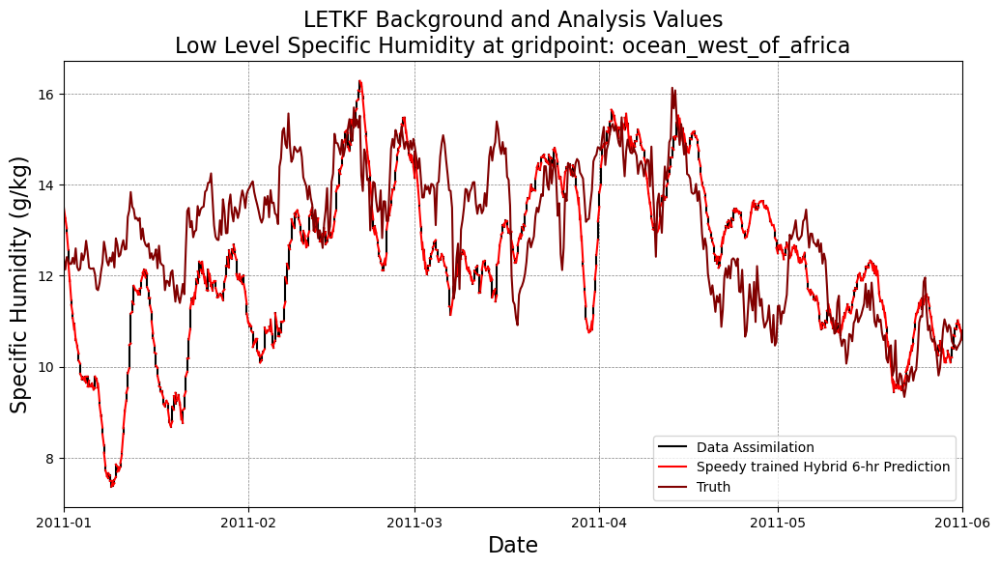

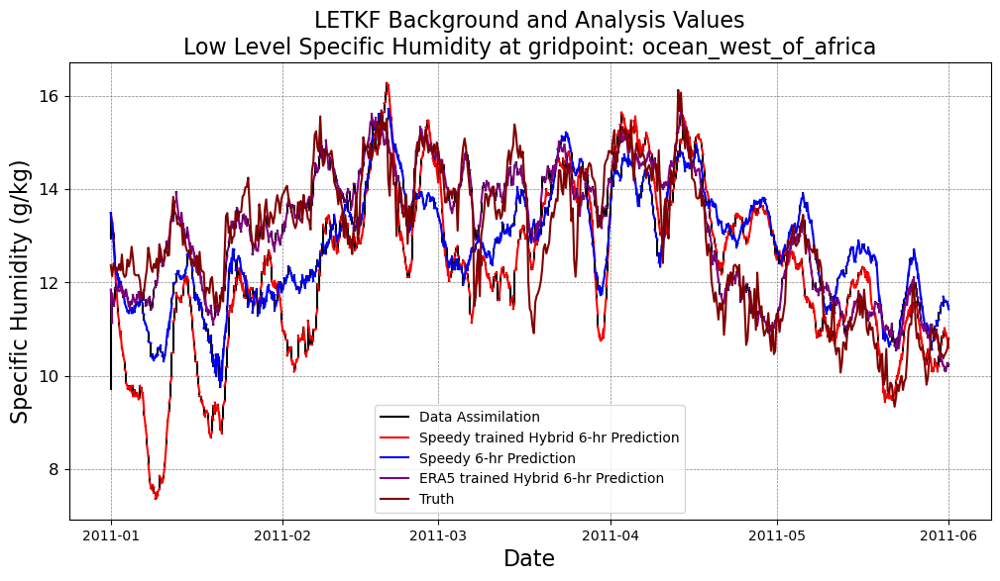

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012200.dat
Processing 85 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011021000.dat
Processing 161 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022812.dat
Processing 235 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022818.dat
Processing 236 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031900.dat
Processing 309 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031906.dat
Processing 310 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031912.dat
Processing 311 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040612.dat
Processing 383 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040618.dat
Processing 384 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040700.dat
Processing 385 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042500.dat
Processing 457 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042506.dat
Processing 458 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042512.dat
Processing 459 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051200.dat
Processing 525 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051318.dat
Processing 532 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051400.dat
Processing 533 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053012.dat
Processing 599 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053018.dat
Processing 600 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
605
(605, 4, 48, 96, 8)
correct for 0s in array by adding nans
605


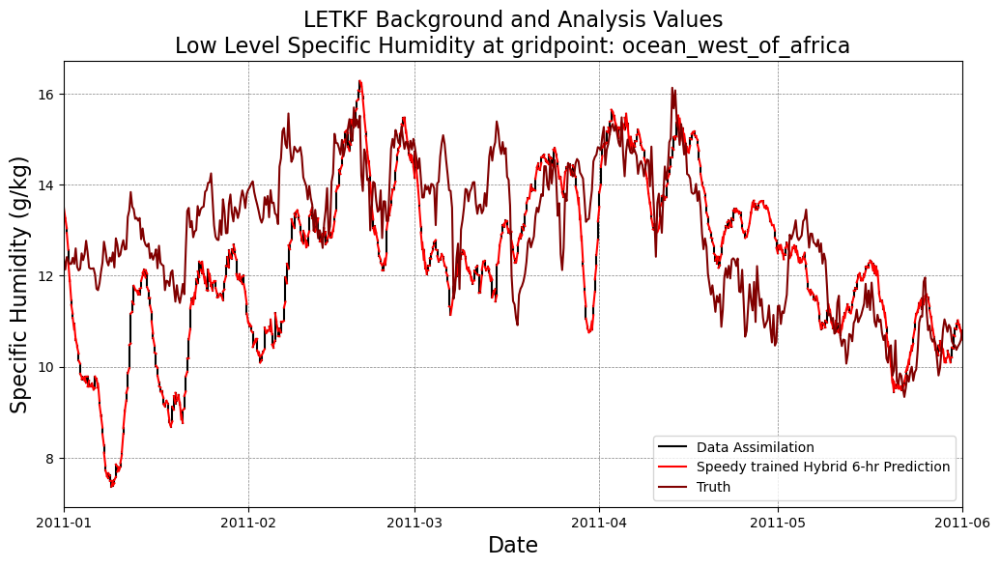

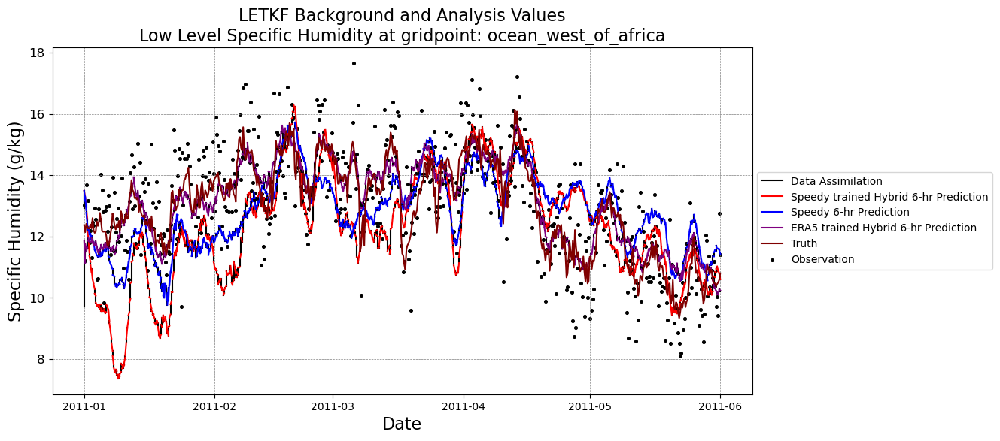

In [4]:
# TEST CELL an individual variable/level combination
# points = ['ocean_west_of_mexico','land_mexico','ocean_west_of_africa','land_africa','persian_gulf']
rmse_time_series_plot_and_maps(.95,'q','ocean_west_of_africa')

Specific_Humidity
point selected was:  gulf_of_alaska
Coordinates: 55 37
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

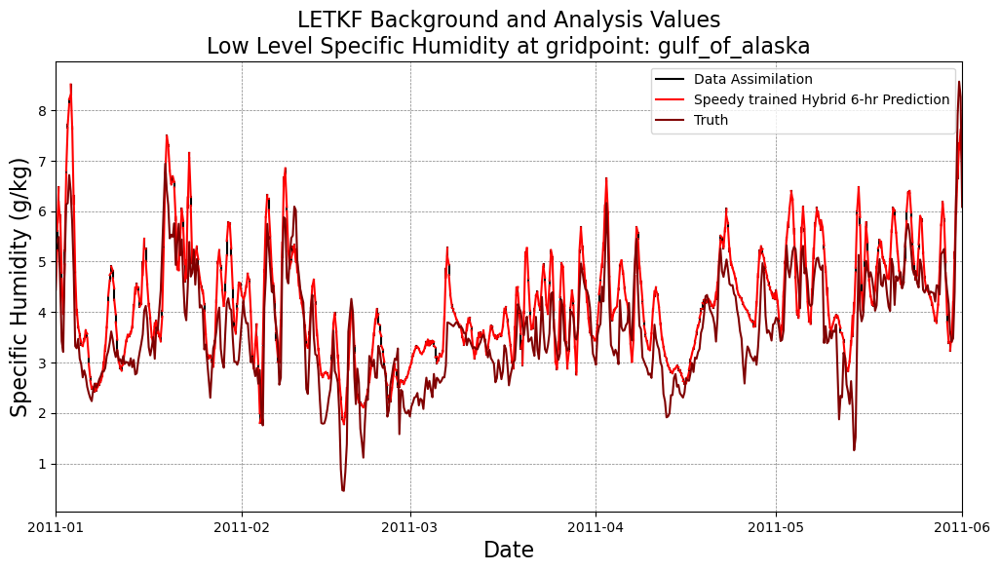

/h/dylanelliott/anaconda3/envs/py_env_plot/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


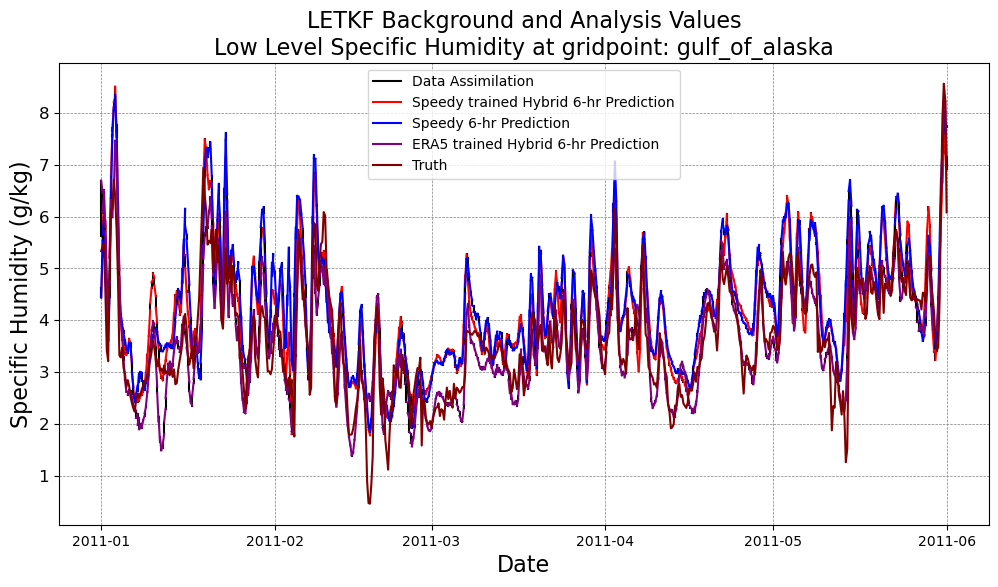

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011011918.dat
Processing 76 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020718.dat
Processing 152 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022612.dat
Processing 227 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022812.dat
Processing 235 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031700.dat
Processing 301 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031900.dat
Processing 309 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040418.dat
Processing 376 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040612.dat
Processing 383 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040618.dat
Processing 384 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042500.dat
Processing 457 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042506.dat
Processing 458 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042512.dat
Processing 459 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051318.dat
Processing 532 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051400.dat
Processing 533 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051406.dat
Processing 534 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053018.dat
Processing 600 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
605
(605, 4, 48, 96, 8)
correct for 0s in array by adding nans
605
(605, 4, 48, 96, 8)
Bingo.
Done.


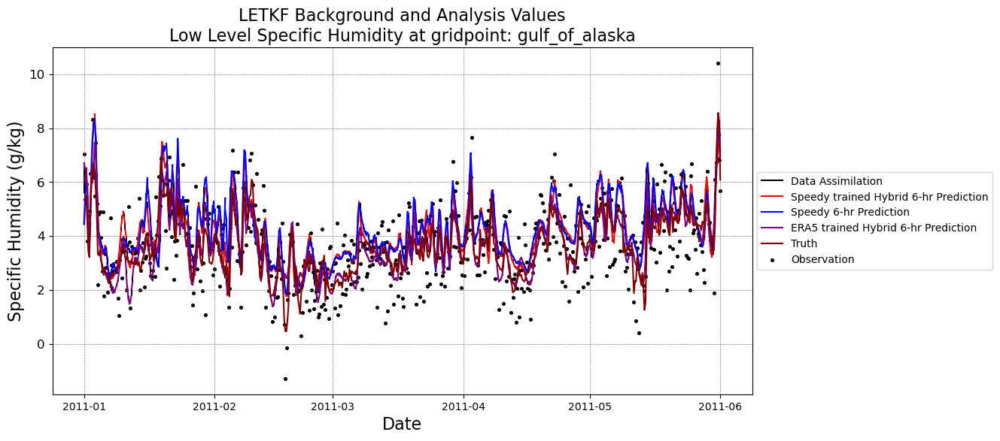

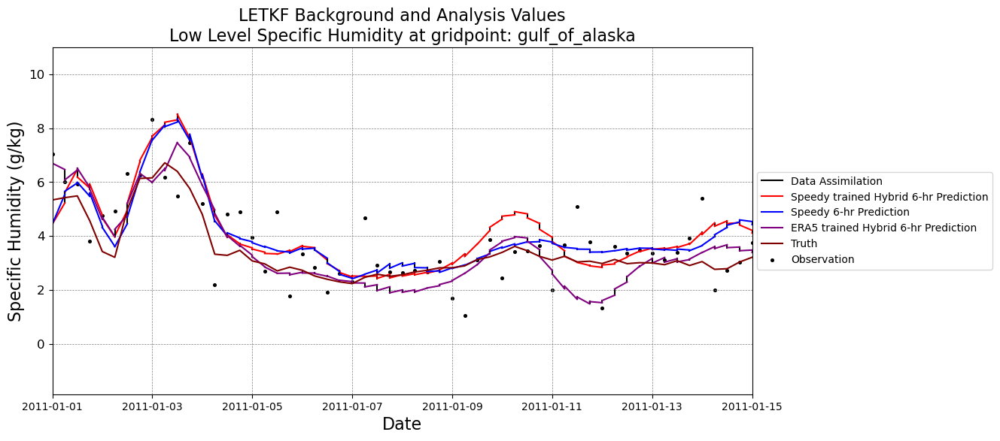

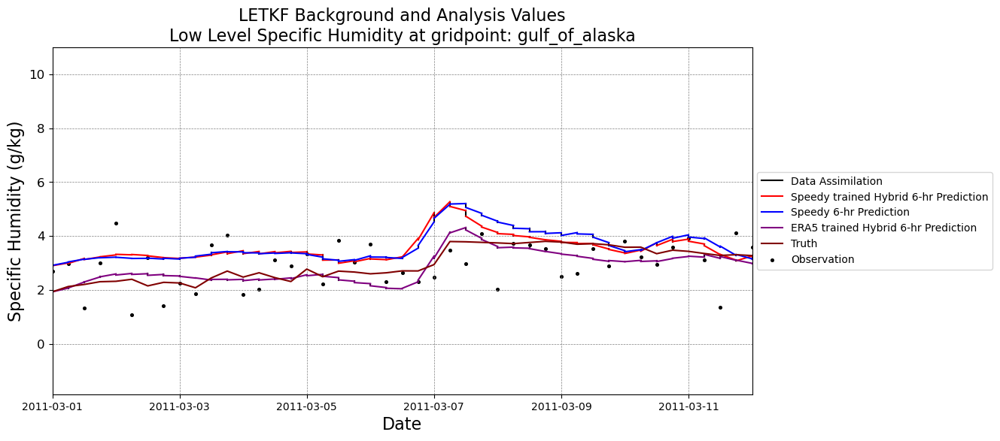

In [9]:
rmse_time_series_plot_and_maps(.95,'q','gulf_of_alaska')

Specific_Humidity
point selected was:  ocean_west_of_mexico
Coordinates: 66 27
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

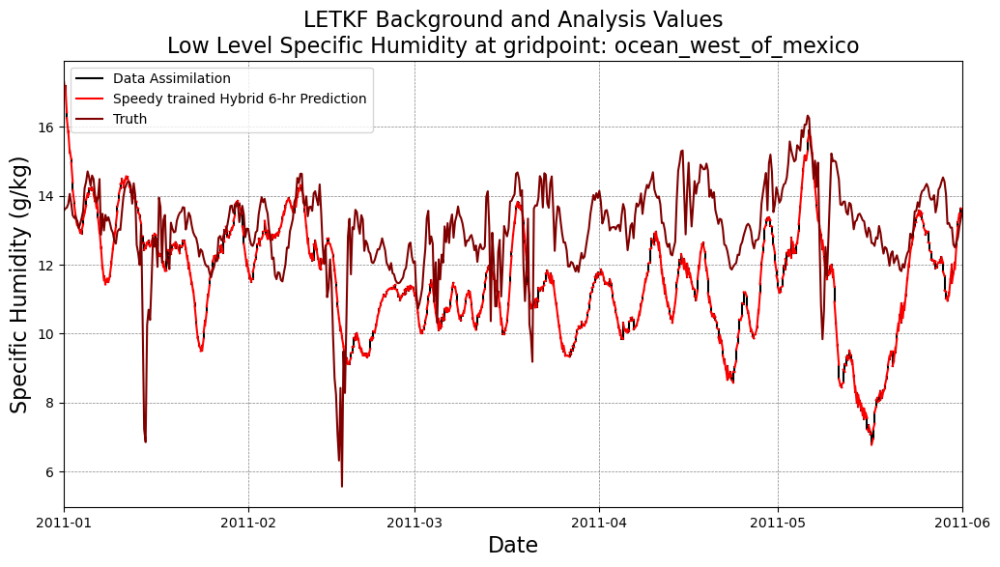

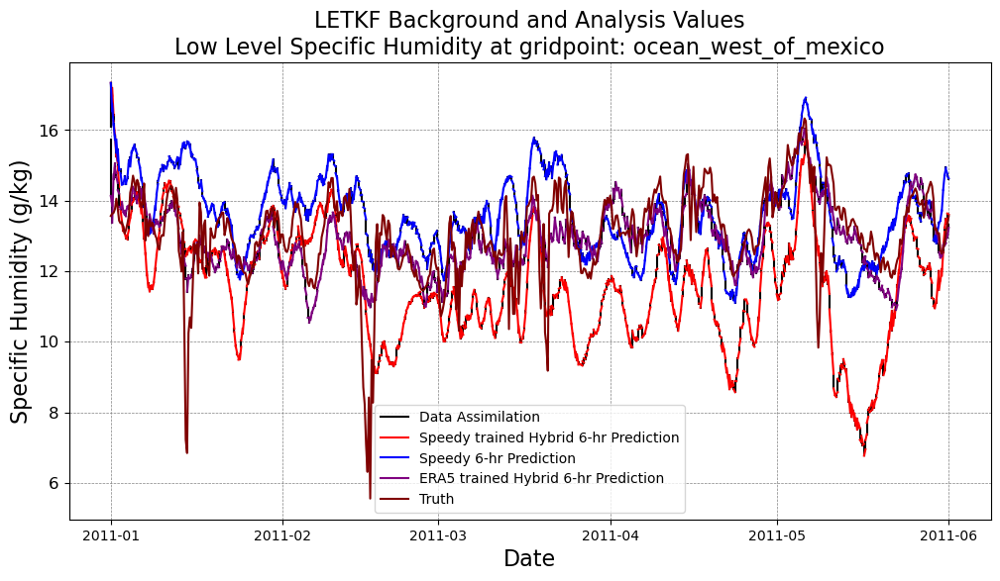

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012200.dat
Processing 85 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011021000.dat
Processing 161 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022812.dat
Processing 235 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022818.dat
Processing 236 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031900.dat
Processing 309 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031906.dat
Processing 310 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040612.dat
Processing 383 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040618.dat
Processing 384 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040700.dat
Processing 385 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042500.dat
Processing 457 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042506.dat
Processing 458 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042512.dat
Processing 459 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051318.dat
Processing 532 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051400.dat
Processing 533 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051406.dat
Processing 534 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
605
(605, 4, 48, 96, 8)
correct for 0s in array by adding nans
605
(605, 4, 48, 96, 8)
Bingo.
Done.


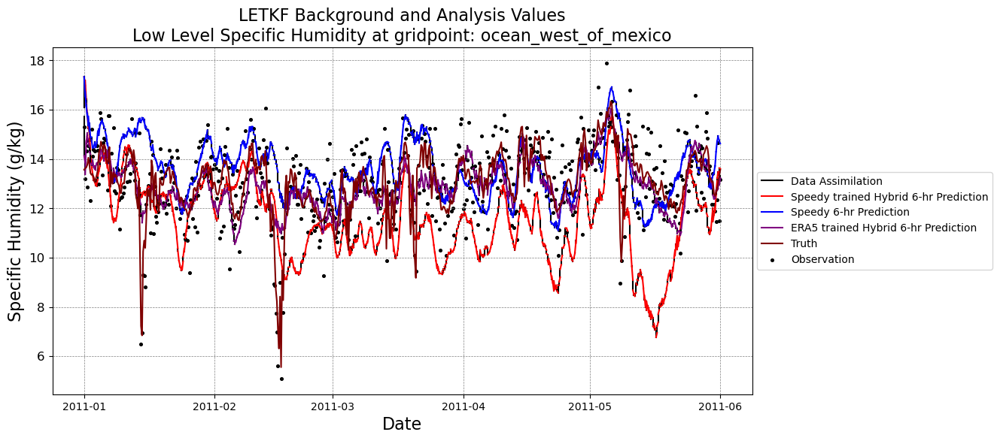

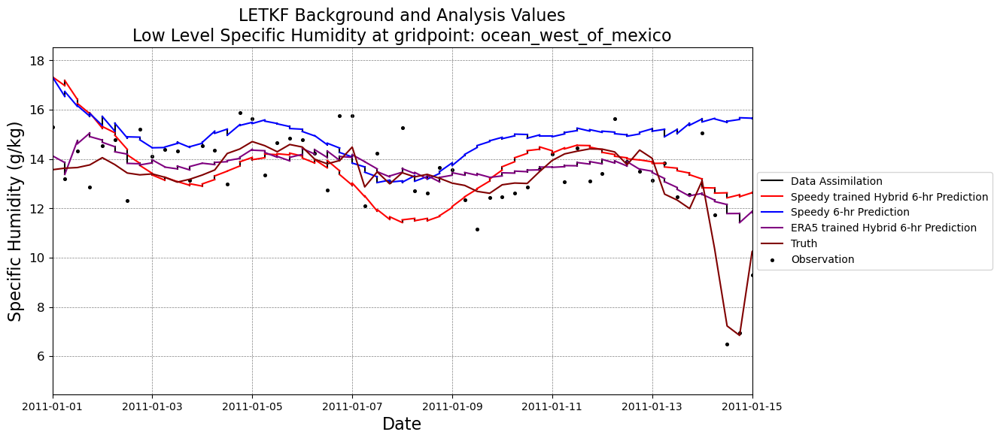

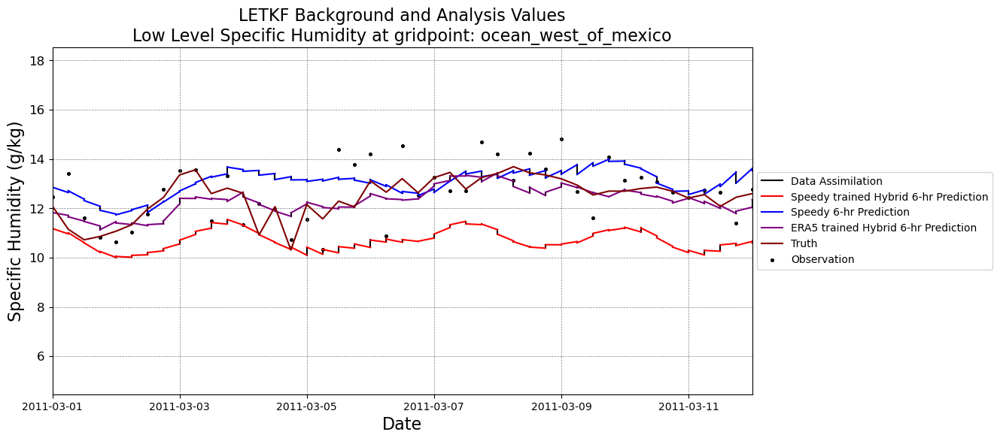

Specific_Humidity
point selected was:  land_mexico
Coordinates: 71 27
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

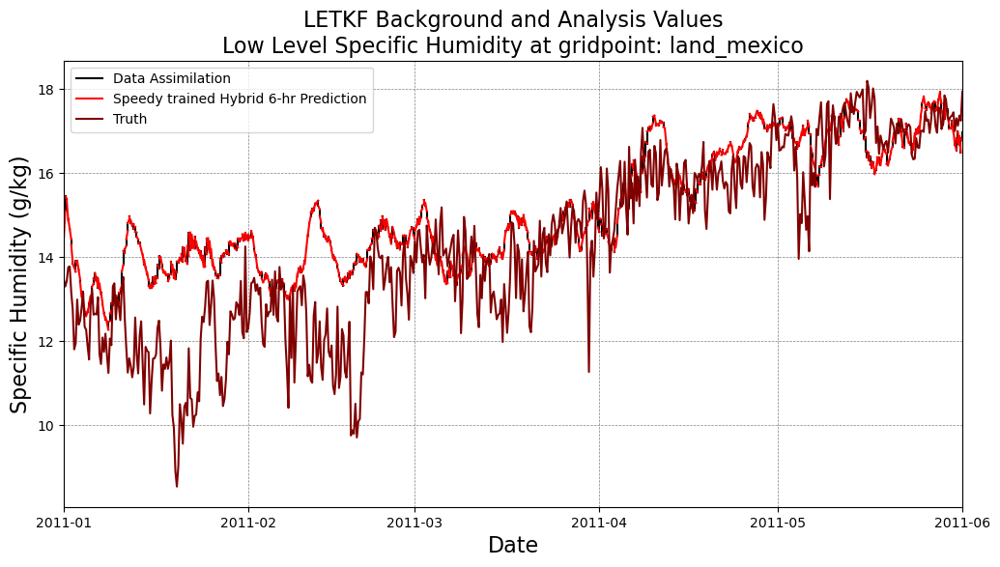

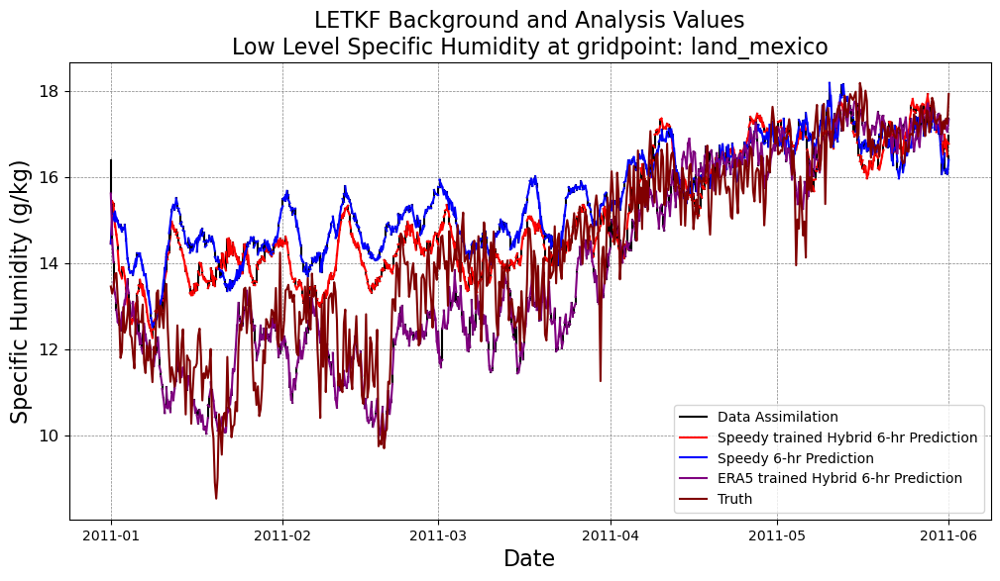

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012200.dat
Processing 85 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011021000.dat
Processing 161 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022612.dat
Processing 227 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022812.dat
Processing 235 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031700.dat
Processing 301 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031900.dat
Processing 309 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040412.dat
Processing 375 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040418.dat
Processing 376 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040612.dat
Processing 383 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042306.dat
Processing 450 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042500.dat
Processing 457 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042506.dat
Processing 458 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051200.dat
Processing 525 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051318.dat
Processing 532 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051400.dat
Processing 533 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053018.dat
Processing 600 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
605
(605, 4, 48, 96, 8)
correct for 0s in array by adding nans
605
(605, 4, 48, 96, 8)
Bingo.
Done.


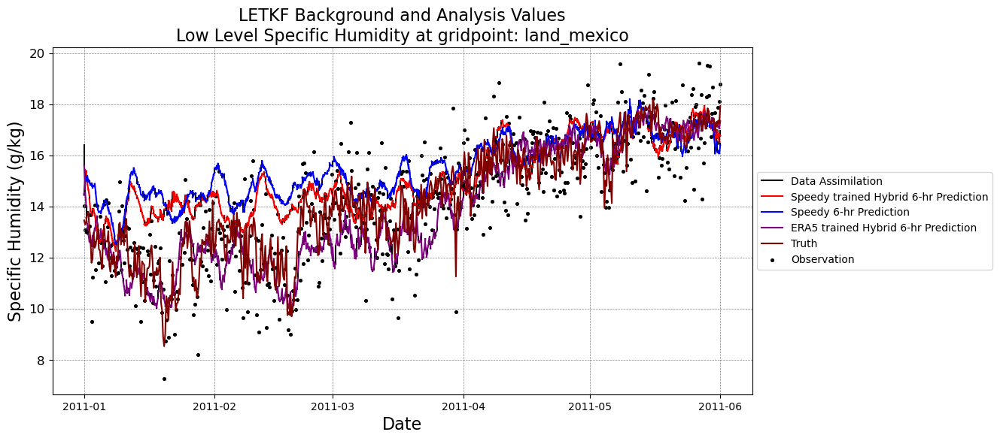

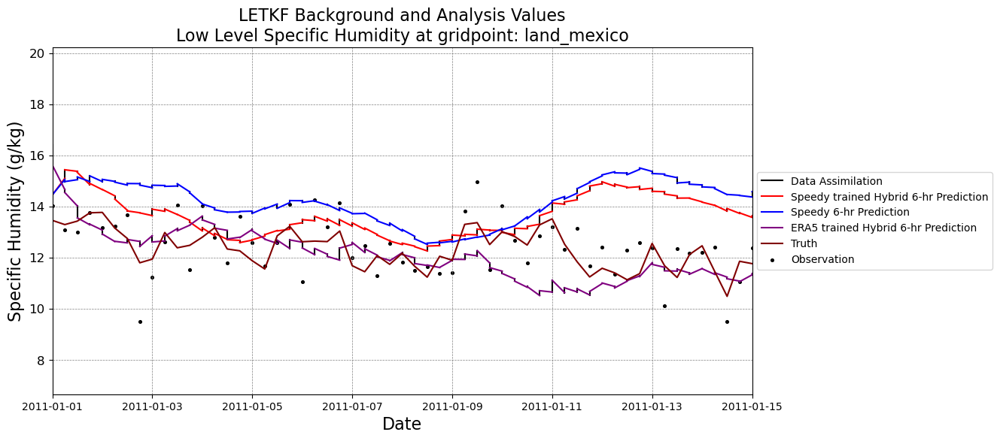

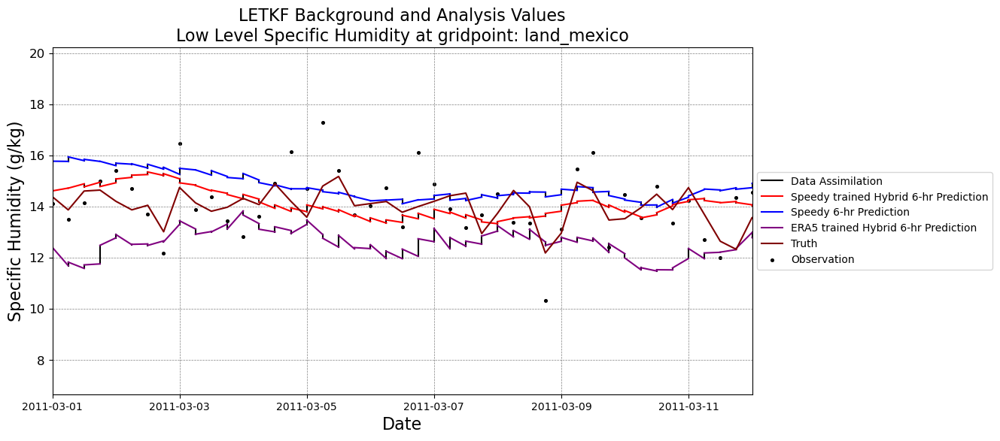

Specific_Humidity
point selected was:  ocean_west_of_africa
Coordinates: 0 20
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

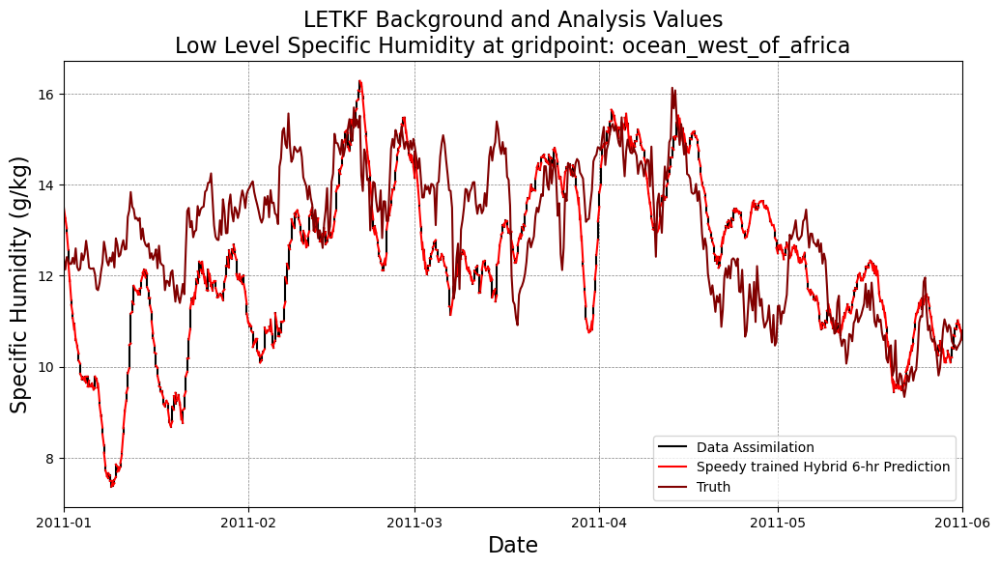

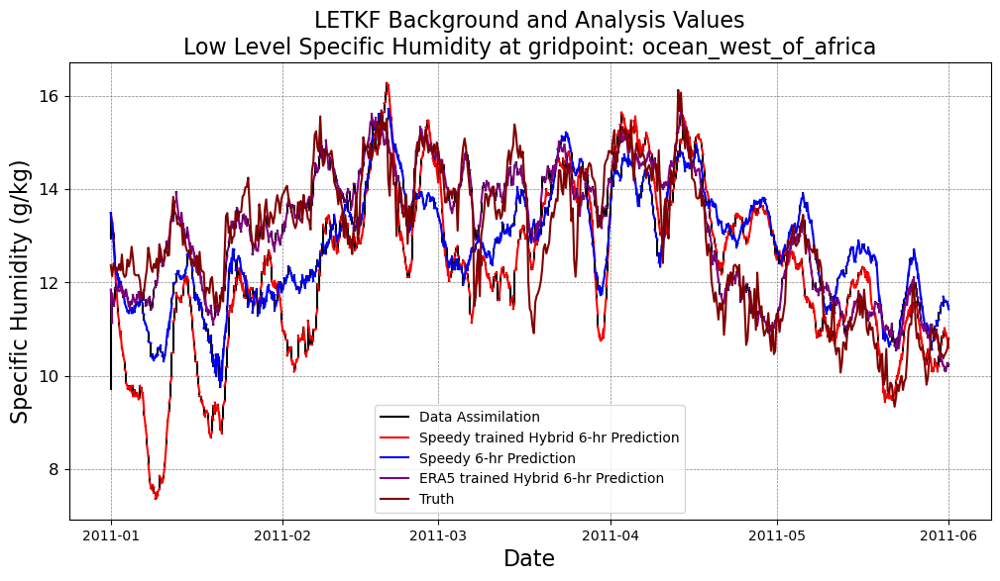

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012200.dat
Processing 85 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011021000.dat
Processing 161 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022812.dat
Processing 235 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022818.dat
Processing 236 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031900.dat
Processing 309 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031906.dat
Processing 310 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040612.dat
Processing 383 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040618.dat
Processing 384 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040700.dat
Processing 385 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042500.dat
Processing 457 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042506.dat
Processing 458 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042512.dat
Processing 459 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051318.dat
Processing 532 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051400.dat
Processing 533 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051406.dat
Processing 534 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
605
(605, 4, 48, 96, 8)
correct for 0s in array by adding nans
605
(605, 4, 48, 96, 8)
Bingo.
Done.


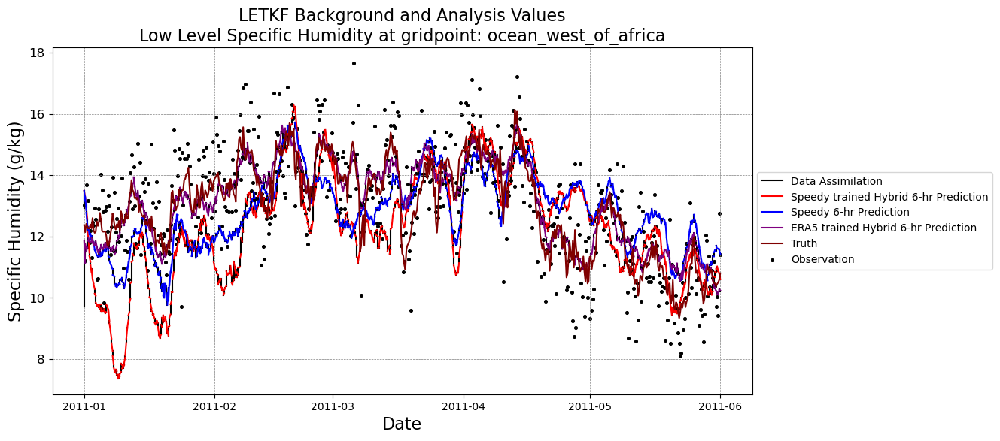

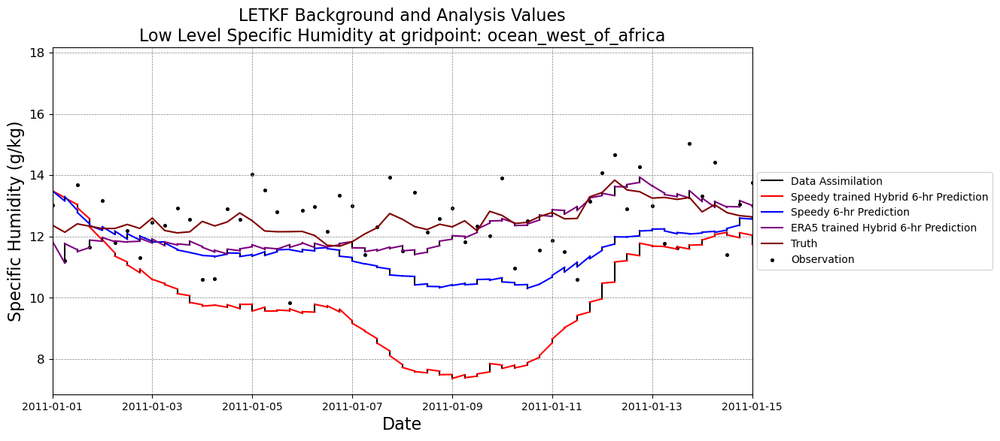

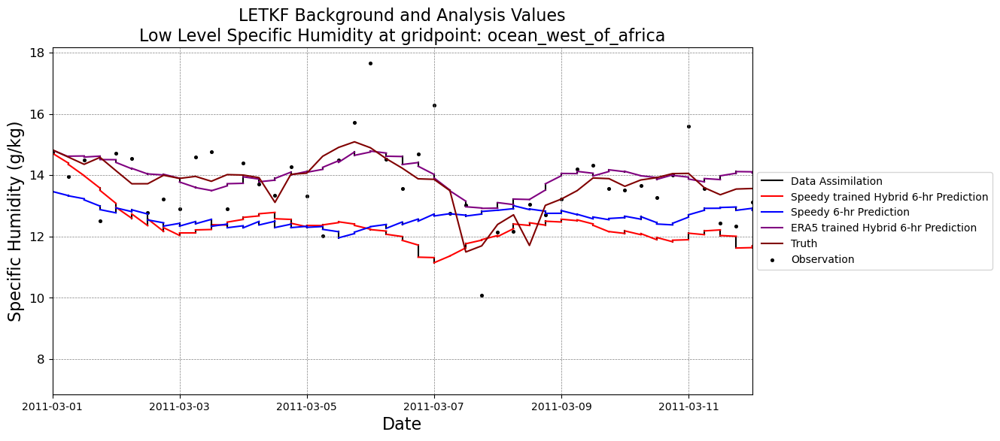

Specific_Humidity
point selected was:  land_africa
Coordinates: 5 20
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

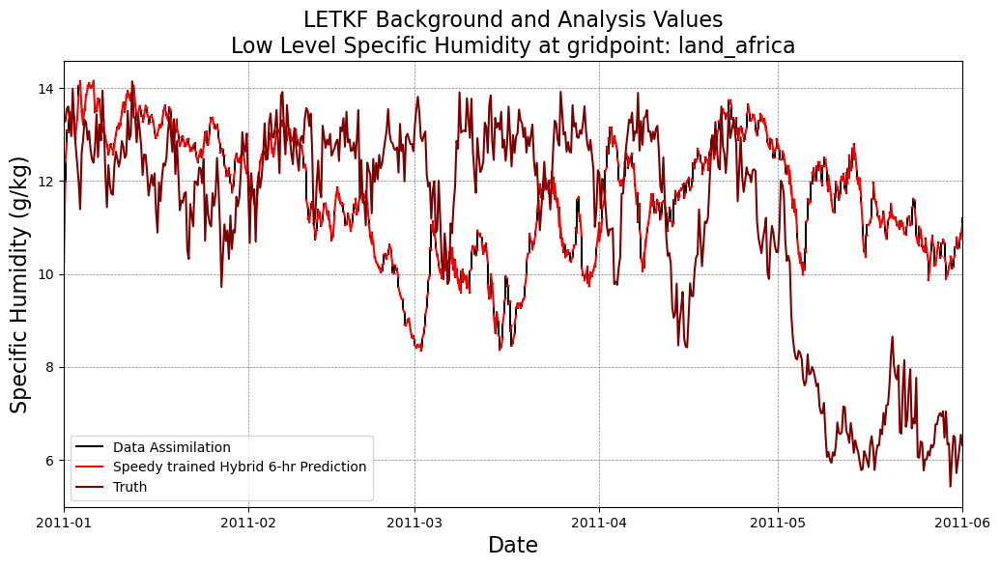

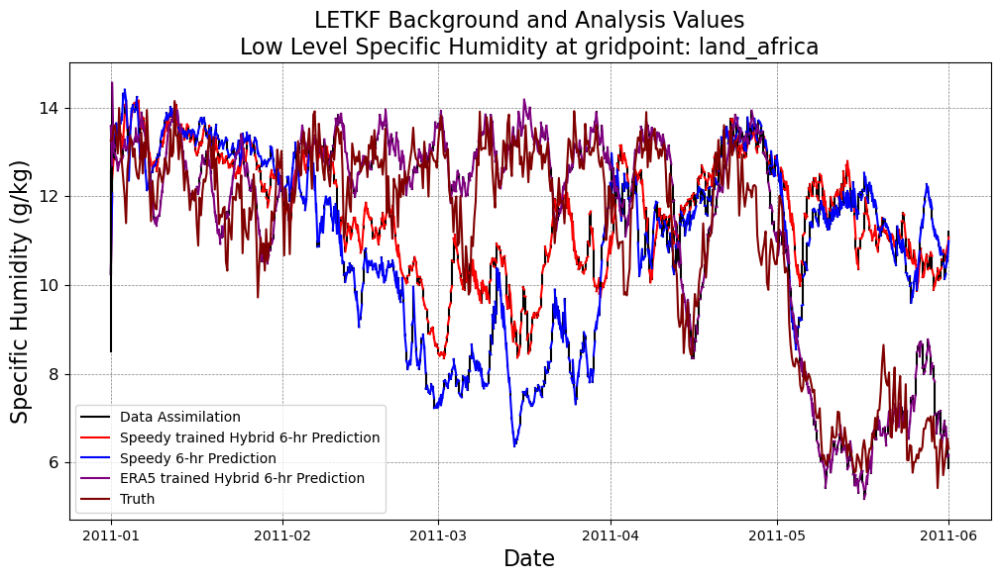

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012200.dat
Processing 85 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020718.dat
Processing 152 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020918.dat
Processing 160 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022606.dat
Processing 226 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022612.dat
Processing 227 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022806.dat
Processing 234 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031618.dat
Processing 300 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031700.dat
Processing 301 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031818.dat
Processing 308 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040406.dat
Processing 374 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040412.dat
Processing 375 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040418.dat
Processing 376 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042218.dat
Processing 448 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042300.dat
Processing 449 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042306.dat
Processing 450 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051112.dat
Processing 523 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051118.dat
Processing 524 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051200.dat
Processing 525 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053000.dat
Processing 597 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053006.dat
Processing 598 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053012.dat
Processing 599 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053018.dat
Processing 600 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[

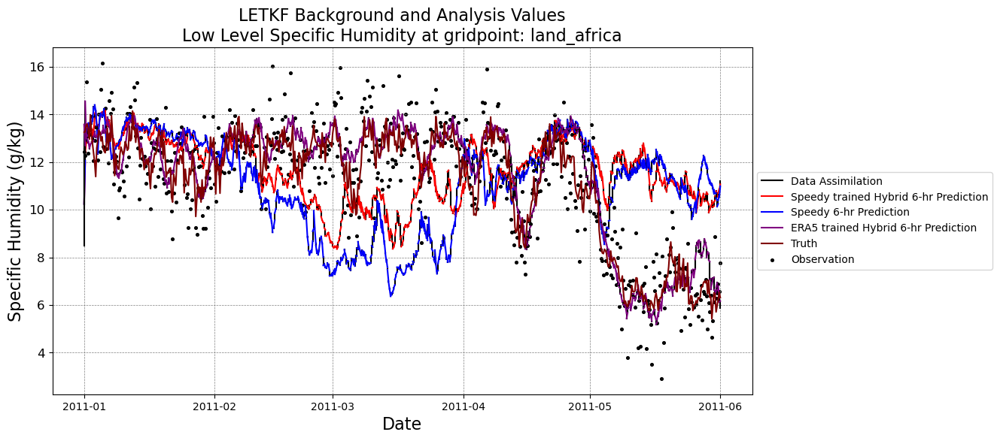

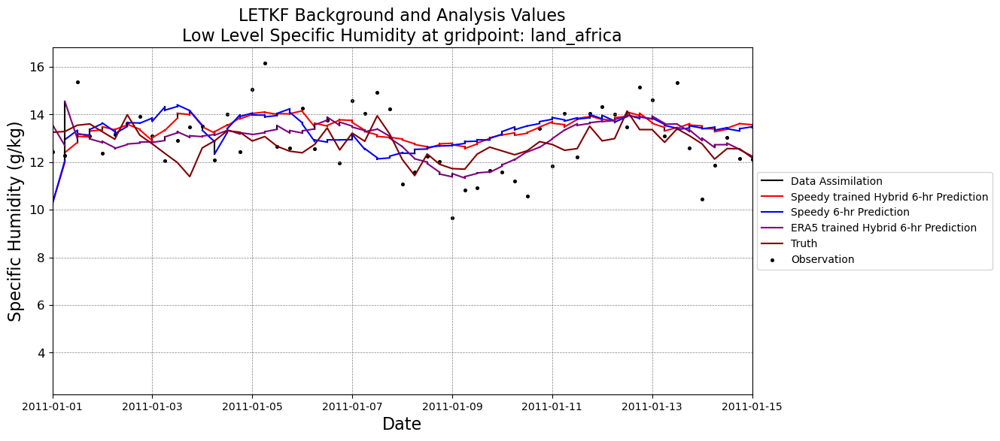

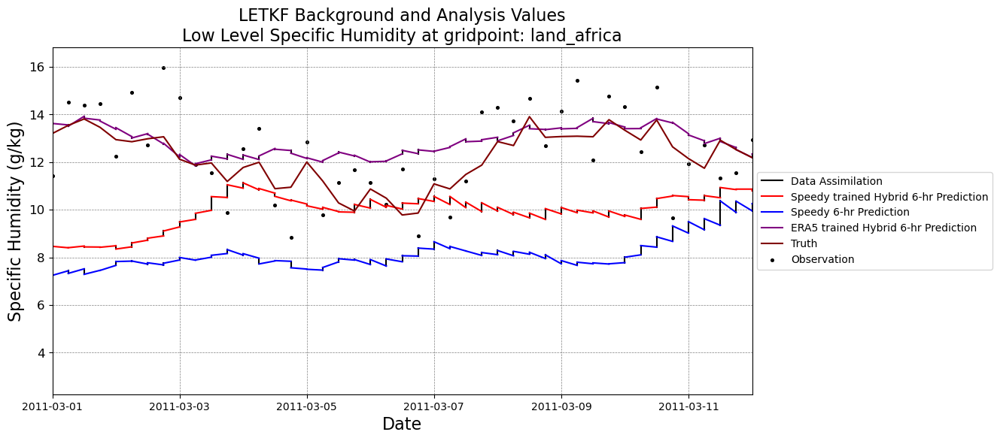

Specific_Humidity
point selected was:  persian_gulf
Coordinates: 13 30
you selected for variable = Specific_Humidity
at level = 0.95
number of timesteps i found..  605
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (605, 48, 96)
speedy shape =  (605, 48, 96)
hybrid shape =  (605, 48, 96)
speedy_index  605
nature_index  605
hybrid_index  605
the smallest length is 605
(605, 48, 96)
(605, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP..
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with ensemble analysis (if any).
(g/kg)
Specific Humidity
looping through hybrid 1.3,1.3 ..


<Figure size 1200x600 with 0 Axes>

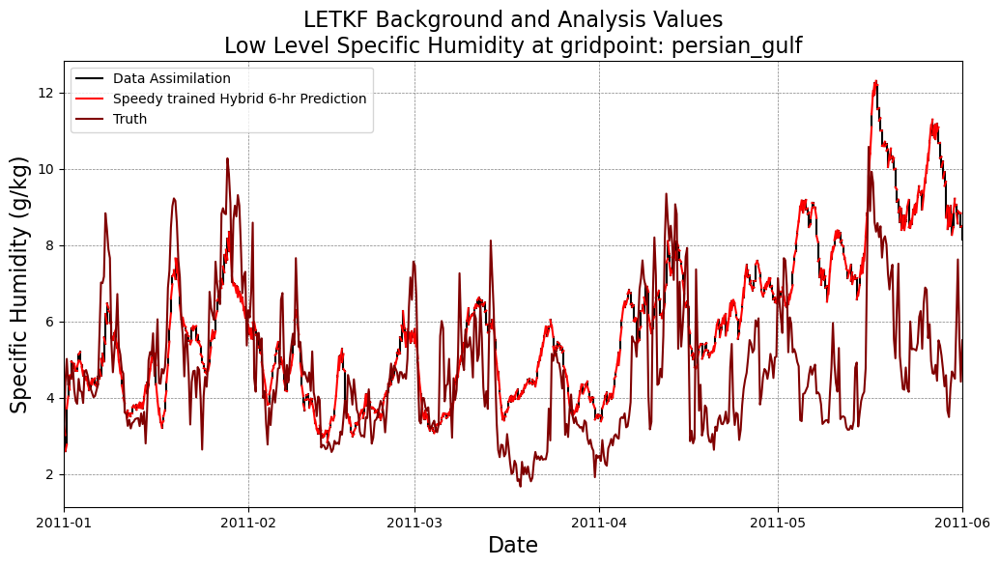

/h/dylanelliott/anaconda3/envs/py_env_plot/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


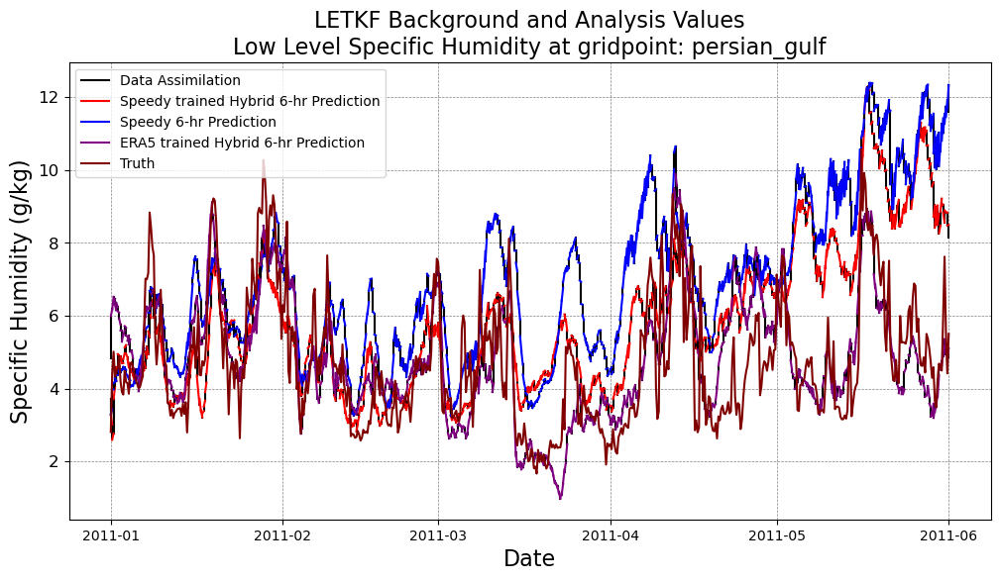

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010100.dat
Processing 1 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010106.dat
Processing 2 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010112.dat
Processing 3 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010118.dat
Processing 4 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010200.dat
Processing 5 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010206.dat
Processing 6 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010212.dat
Processing 7 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010218.dat
Processing 8 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011010300.dat
Processing 9 of 1460 timesteps
/skydata2/dylanelli

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011011918.dat
Processing 76 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012000.dat
Processing 77 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012006.dat
Processing 78 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012012.dat
Processing 79 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012018.dat
Processing 80 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012100.dat
Processing 81 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012106.dat
Processing 82 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012112.dat
Processing 83 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011012118.dat
Processing 84 of 1460 timesteps
/skydata2/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020712.dat
Processing 151 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020718.dat
Processing 152 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020800.dat
Processing 153 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020806.dat
Processing 154 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020812.dat
Processing 155 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020818.dat
Processing 156 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020900.dat
Processing 157 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020906.dat
Processing 158 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011020912.dat
Processing 159 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022600.dat
Processing 225 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022606.dat
Processing 226 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022612.dat
Processing 227 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022618.dat
Processing 228 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022700.dat
Processing 229 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022706.dat
Processing 230 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022712.dat
Processing 231 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022718.dat
Processing 232 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011022800.dat
Processing 233 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031612.dat
Processing 299 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031618.dat
Processing 300 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031700.dat
Processing 301 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031706.dat
Processing 302 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031712.dat
Processing 303 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031718.dat
Processing 304 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031800.dat
Processing 305 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031806.dat
Processing 306 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011031812.dat
Processing 307 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040406.dat
Processing 374 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040412.dat
Processing 375 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040418.dat
Processing 376 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040500.dat
Processing 377 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040506.dat
Processing 378 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040512.dat
Processing 379 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040518.dat
Processing 380 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040600.dat
Processing 381 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011040606.dat
Processing 382 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042218.dat
Processing 448 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042300.dat
Processing 449 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042306.dat
Processing 450 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042312.dat
Processing 451 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042318.dat
Processing 452 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042400.dat
Processing 453 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042406.dat
Processing 454 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042412.dat
Processing 455 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011042418.dat
Processing 456 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051112.dat
Processing 523 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051118.dat
Processing 524 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051200.dat
Processing 525 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051206.dat
Processing 526 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051212.dat
Processing 527 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051218.dat
Processing 528 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051300.dat
Processing 529 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051306.dat
Processing 530 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011051312.dat
Processing 531 of 1460 timesteps
/

/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053000.dat
Processing 597 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053006.dat
Processing 598 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053012.dat
Processing 599 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053018.dat
Processing 600 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053100.dat
Processing 601 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053106.dat
Processing 602 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053112.dat
Processing 603 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011053118.dat
Processing 604 of 1460 timesteps
/skydata2/dylanelliott/letkf-hybrid-speedy/DATA/obs_netcdftest/2011060100.dat
Processing 605 of 1460 timesteps
[

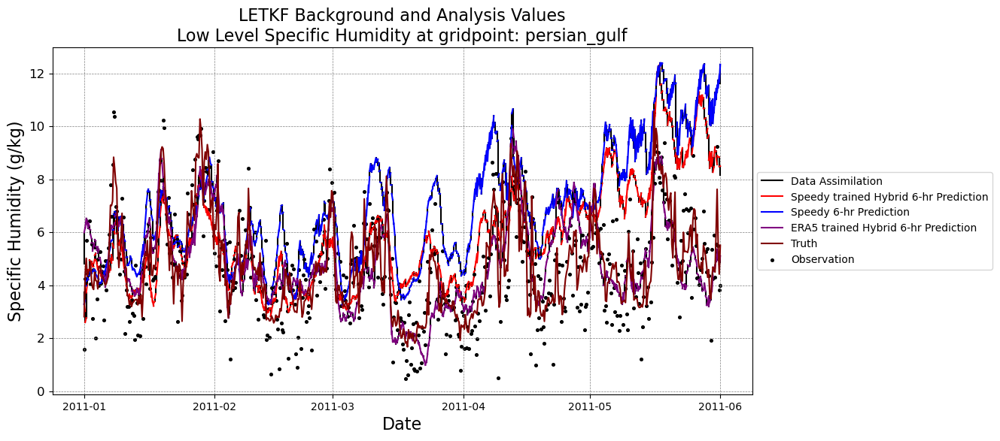

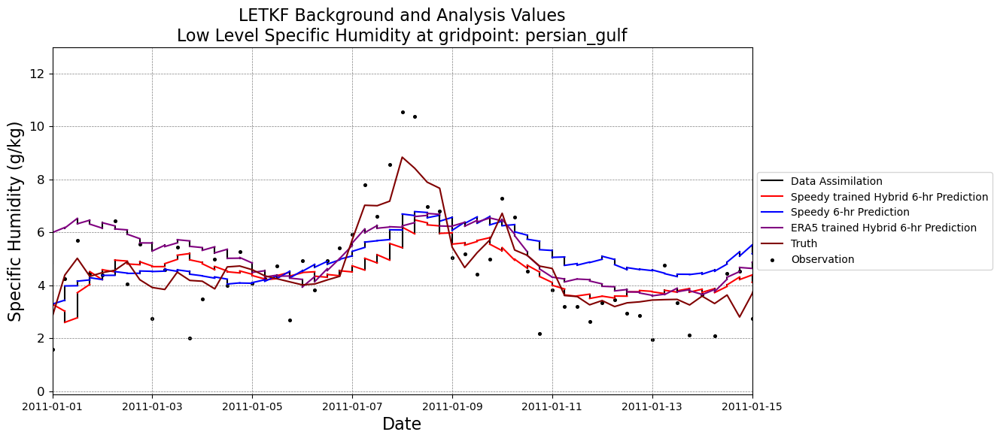

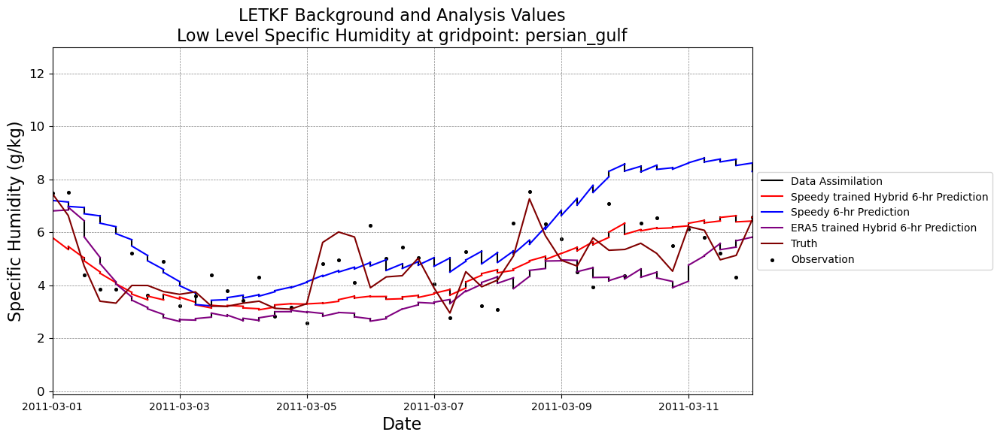

In [6]:
# Cycle through just points list
points = ['ocean_west_of_mexico','land_mexico','ocean_west_of_africa','land_africa','persian_gulf']

level = .95
variable = 'q'

for selected_point in points:
    rmse_time_series_plot_and_maps(level,variable,selected_point)

U-wind
you selected for variable = U-wind
at level = 0.95
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = U-wind
at level = 0.95
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(m/s)
Zonal Wind
Map_of_level_0.95_variable_u_ERA5.png


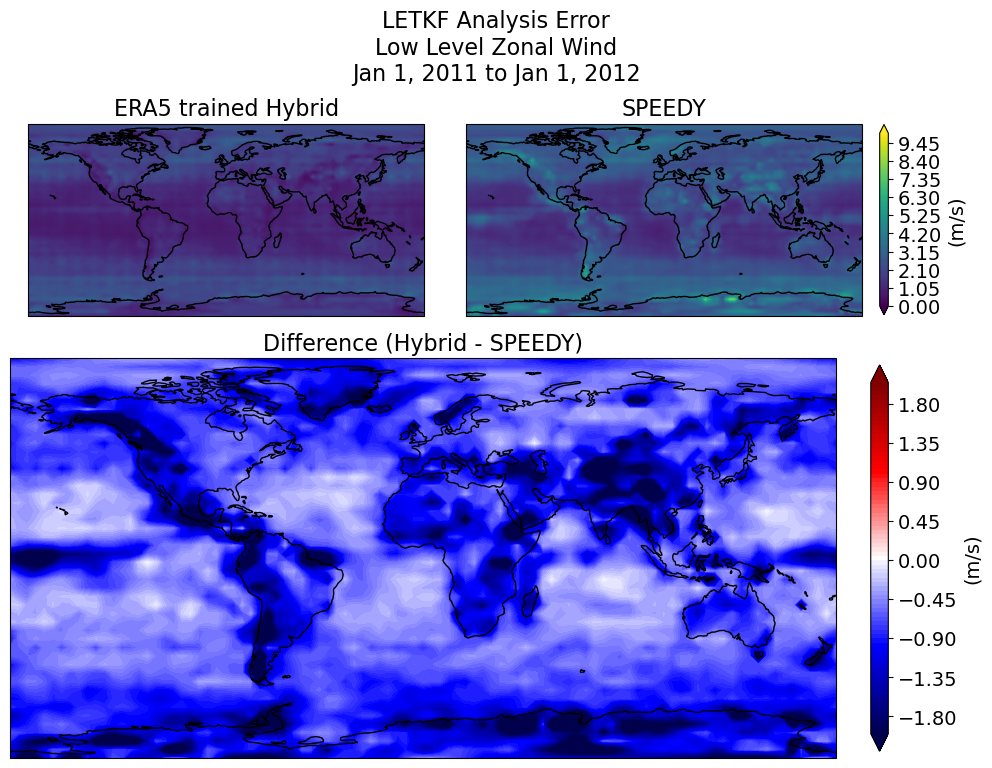

looping through hybrid 1.3,1.3 ..
Map_of_level_0.95_variable_u_hybrid_speedy.png


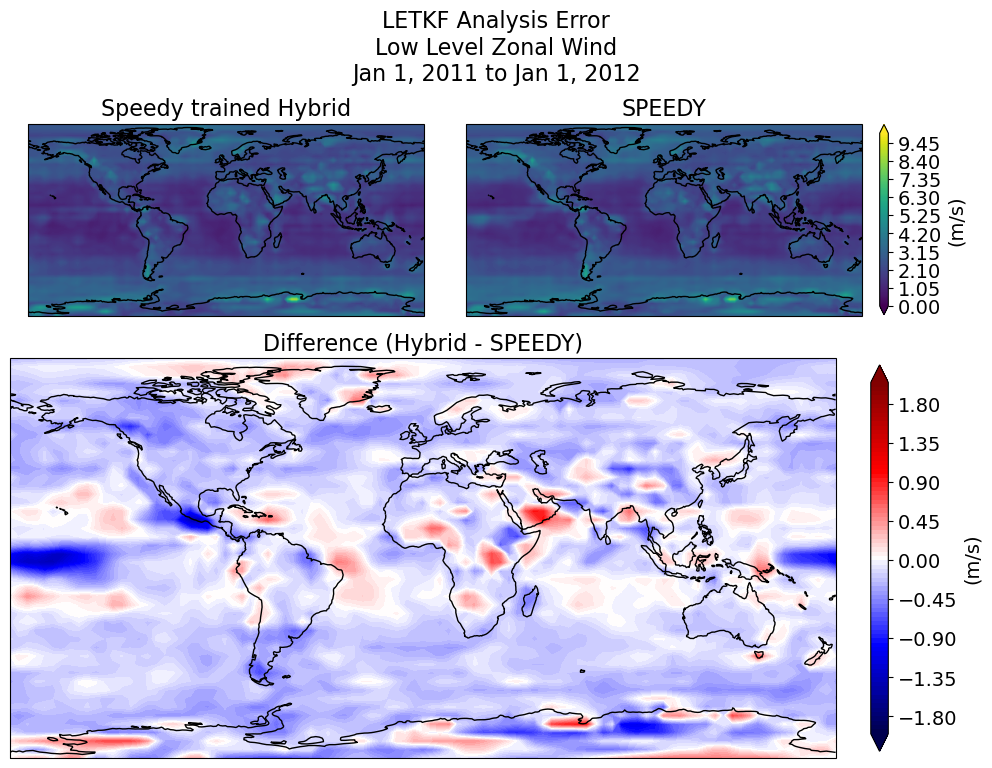

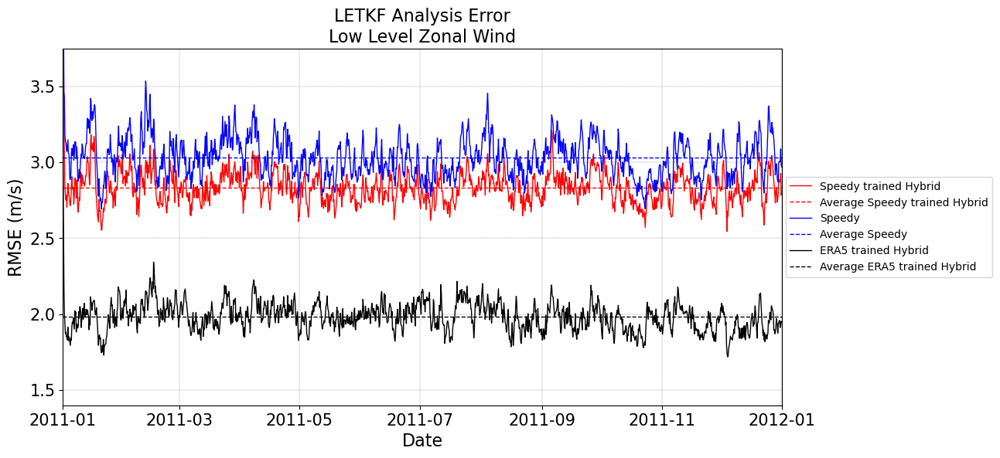

Temperature
you selected for variable = Temperature
at level = 0.95
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = Temperature
at level = 0.95
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(K)
Temperature
Map_of_level_0.95_variable_t_ERA5.png


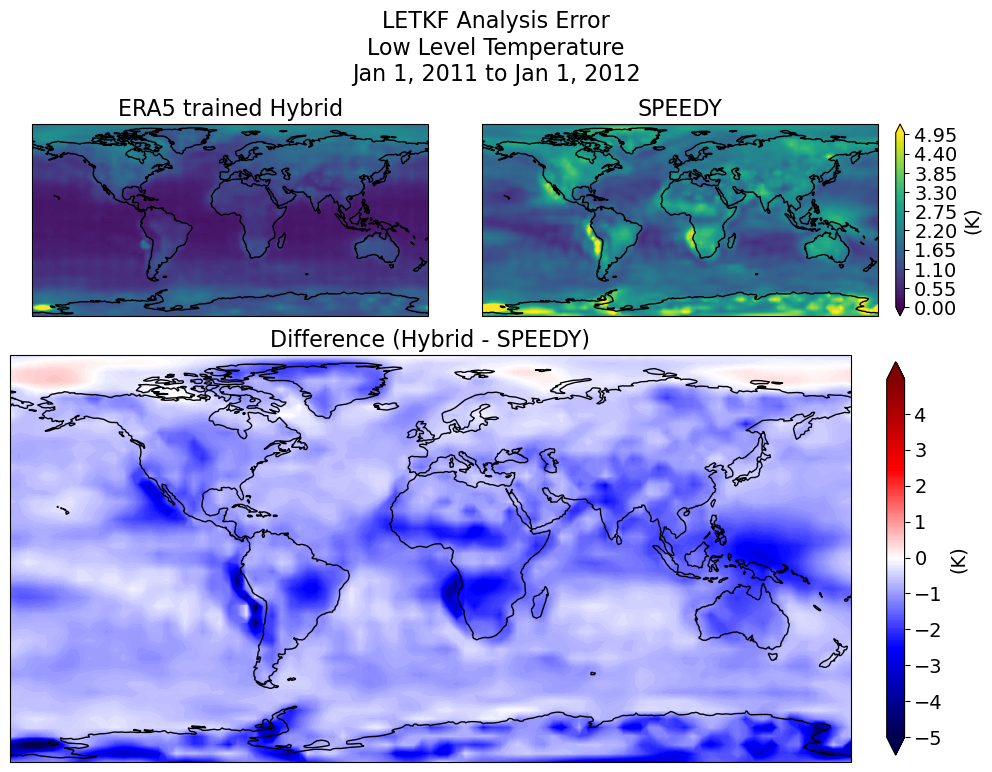

looping through hybrid 1.3,1.3 ..
Map_of_level_0.95_variable_t_hybrid_speedy.png


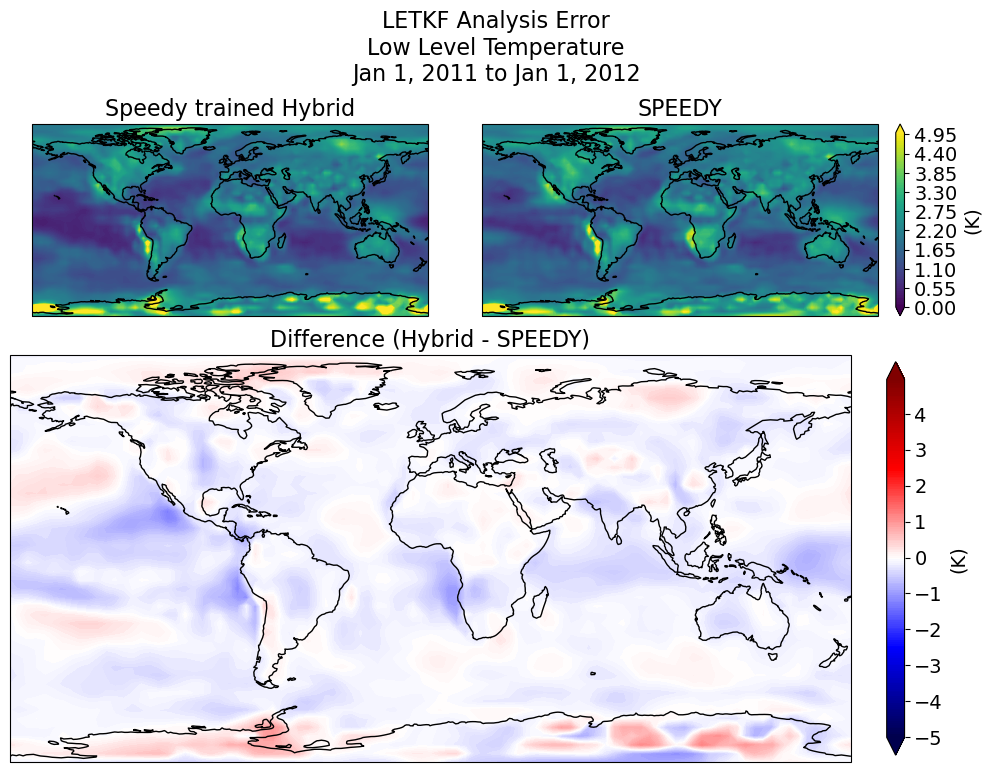

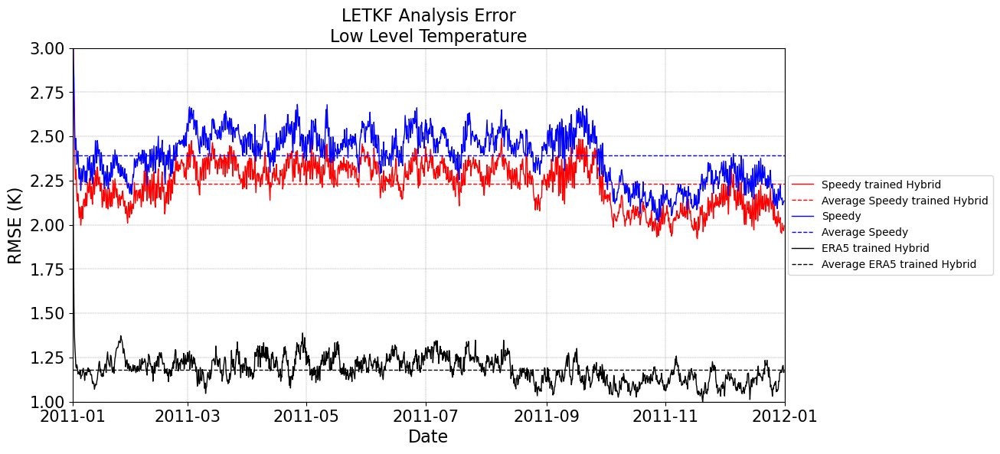

V-wind
you selected for variable = V-wind
at level = 0.95
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = V-wind
at level = 0.95
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(m/s)
Meridional Wind
Map_of_level_0.95_variable_v_ERA5.png


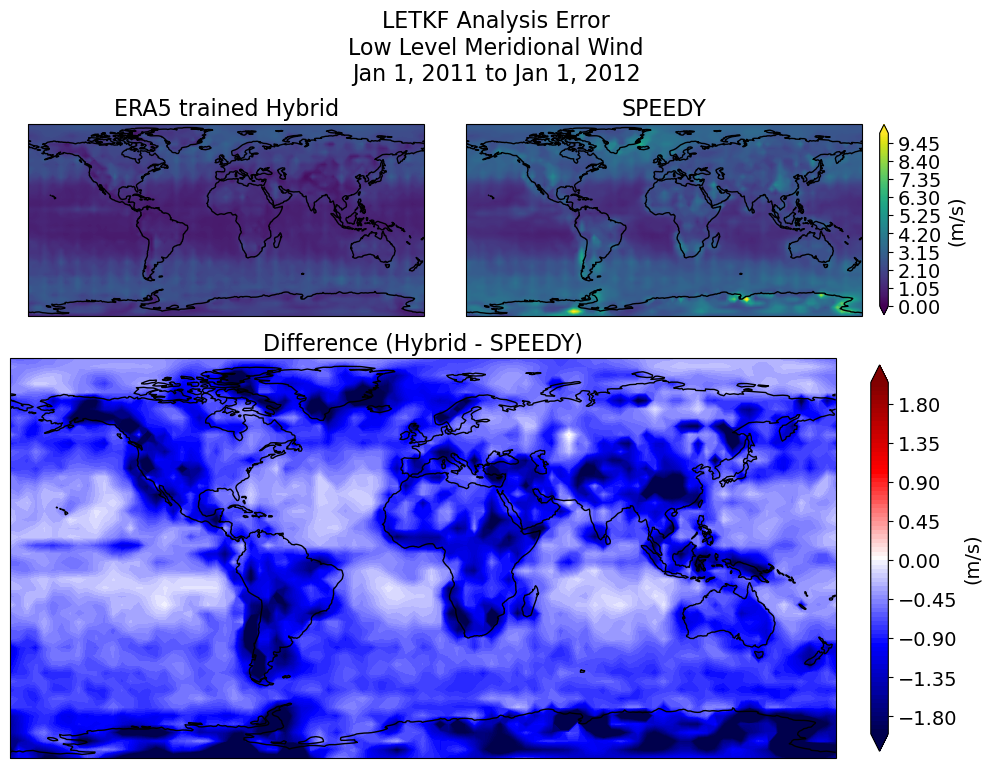

looping through hybrid 1.3,1.3 ..
Map_of_level_0.95_variable_v_hybrid_speedy.png


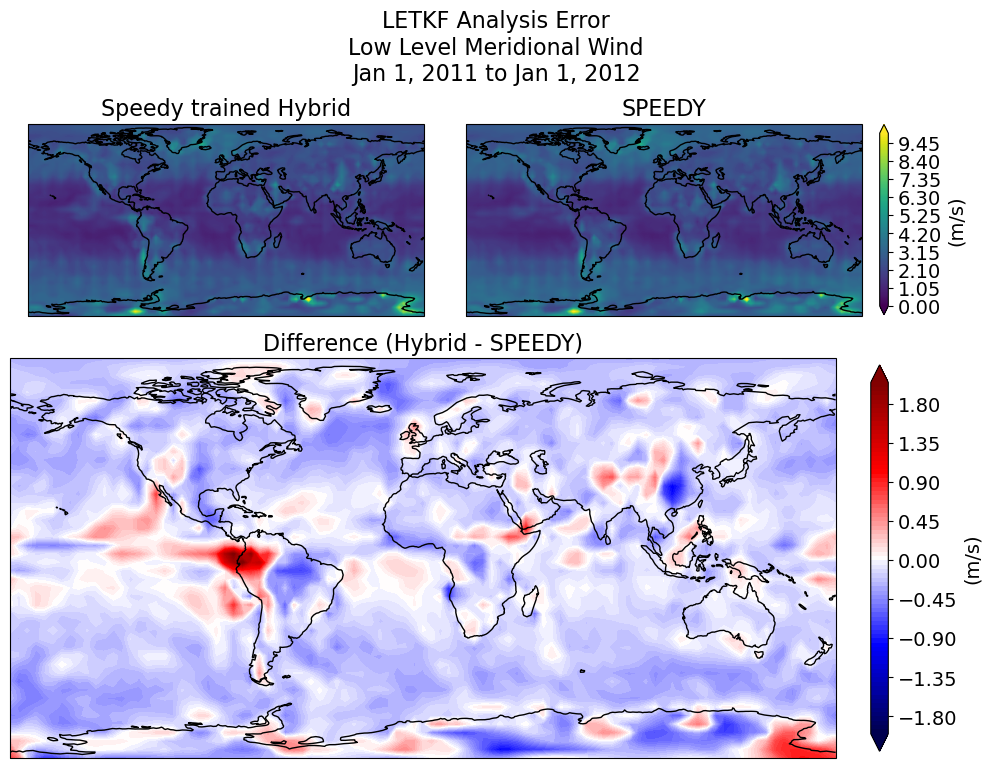

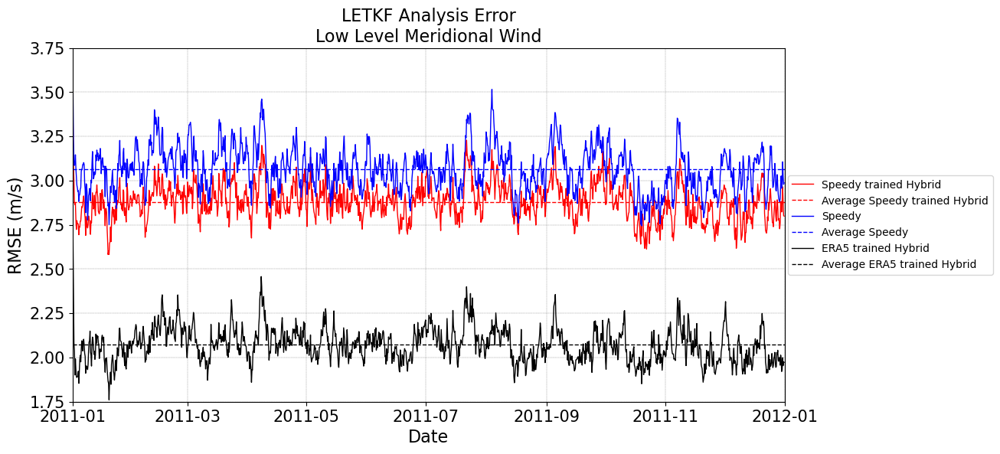

Specific_Humidity
you selected for variable = Specific_Humidity
at level = 0.95
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = Specific_Humidity
at level = 0.95
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(g/kg)
Specific Humidity
Map_of_level_0.95_variable_q_ERA5.png


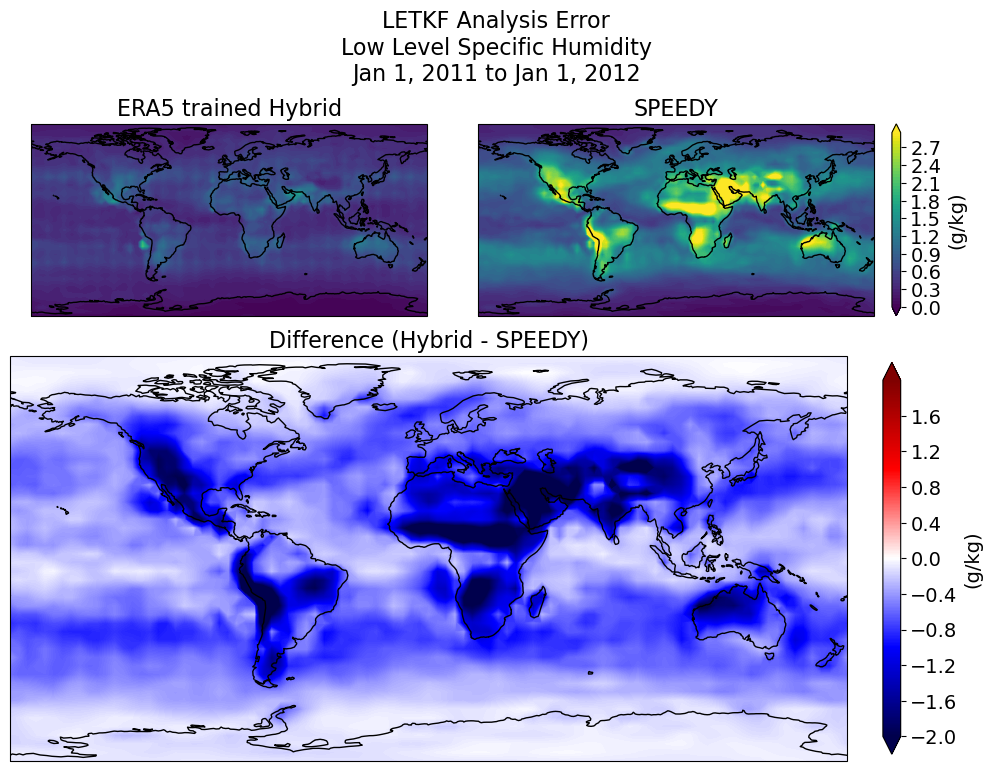

looping through hybrid 1.3,1.3 ..
Map_of_level_0.95_variable_q_hybrid_speedy.png


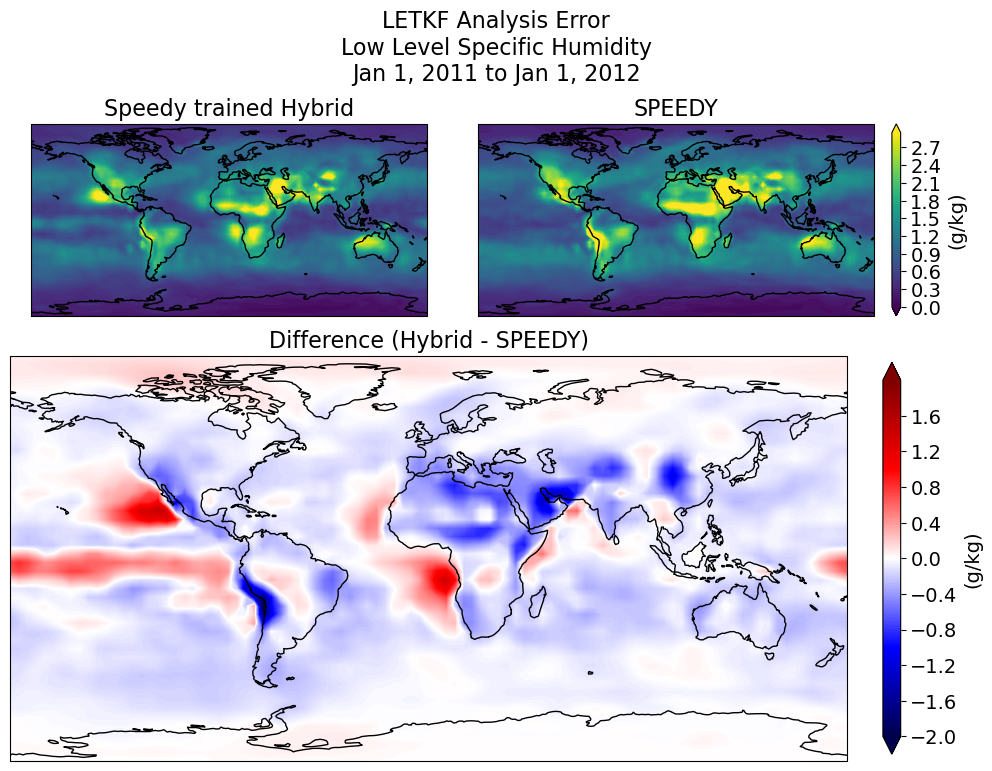

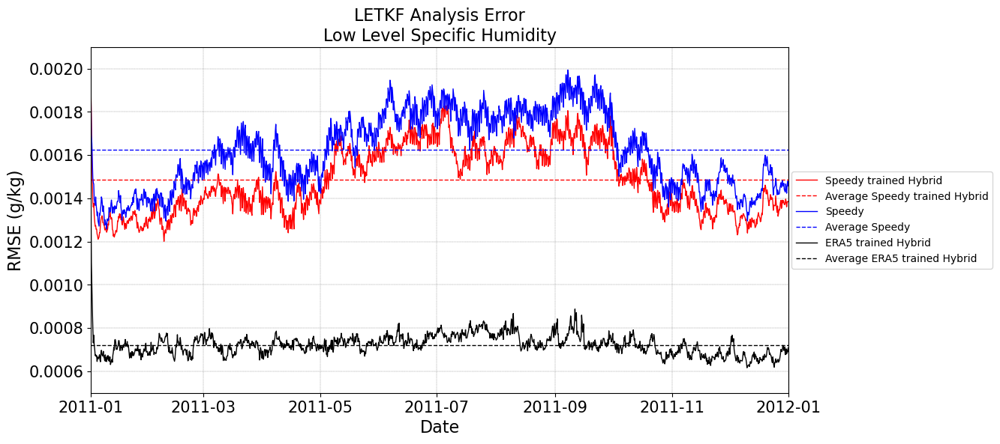

U-wind
you selected for variable = U-wind
at level = 0.2
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = U-wind
at level = 0.2
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(m/s)
Zonal Wind
Map_of_level_0.2_variable_u_ERA5.png


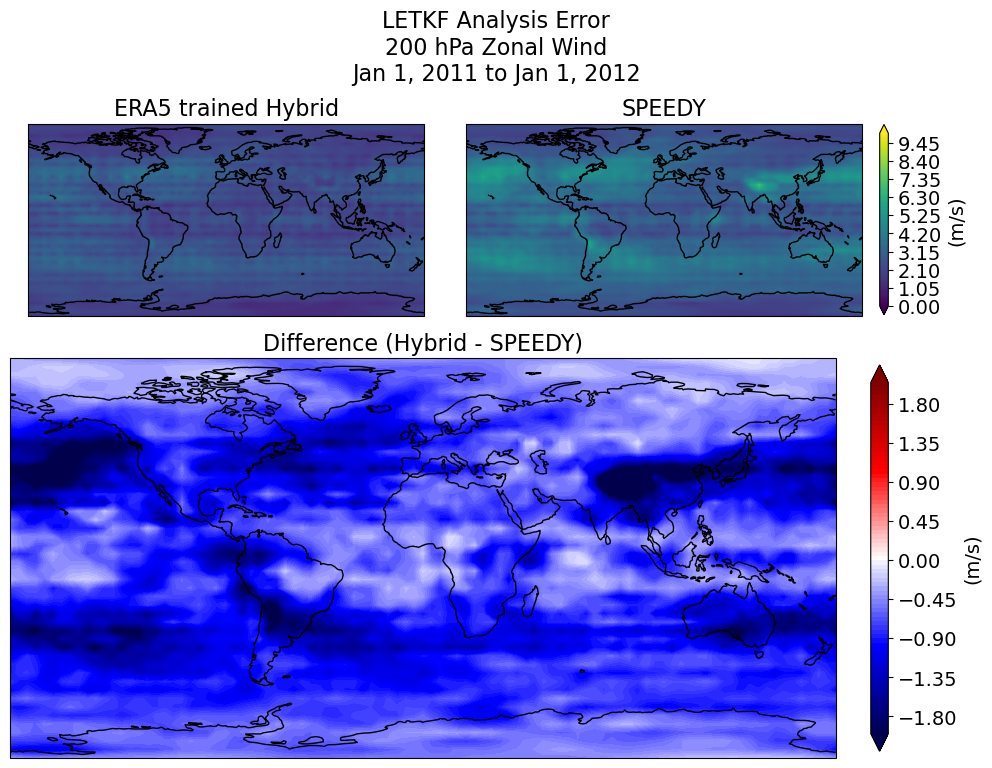

looping through hybrid 1.3,1.3 ..
Map_of_level_0.2_variable_u_hybrid_speedy.png


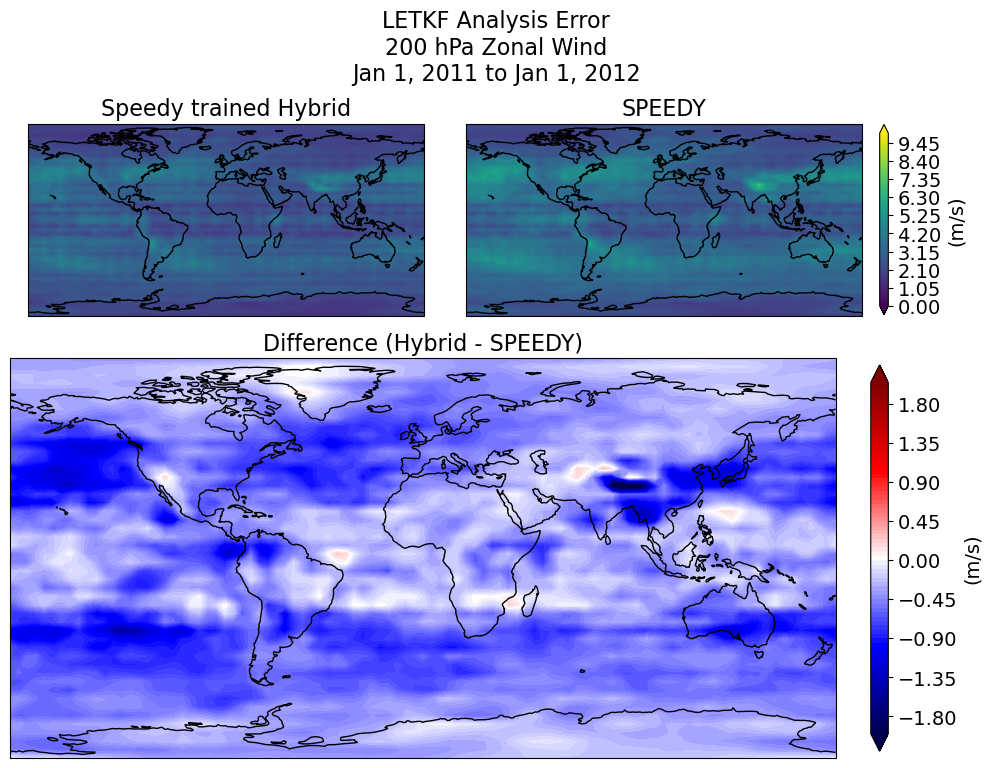

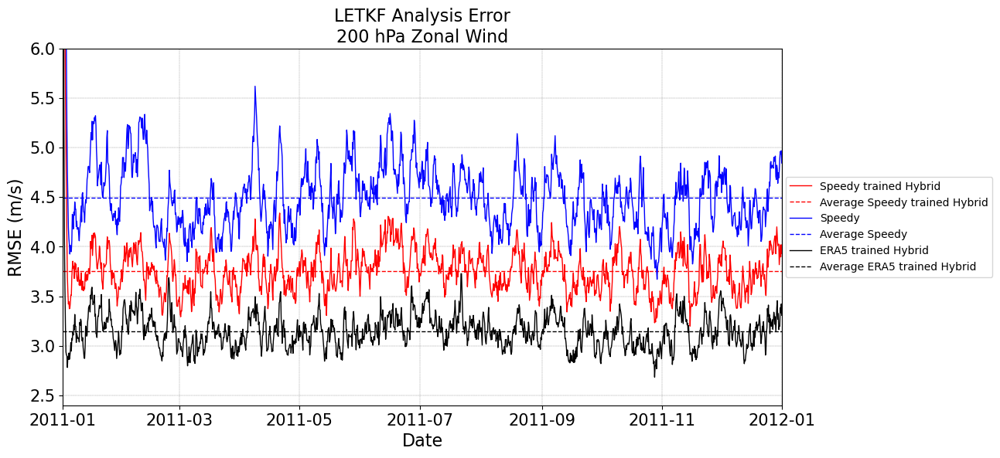

Temperature
you selected for variable = Temperature
at level = 0.2
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = Temperature
at level = 0.2
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(K)
Temperature
Map_of_level_0.2_variable_t_ERA5.png


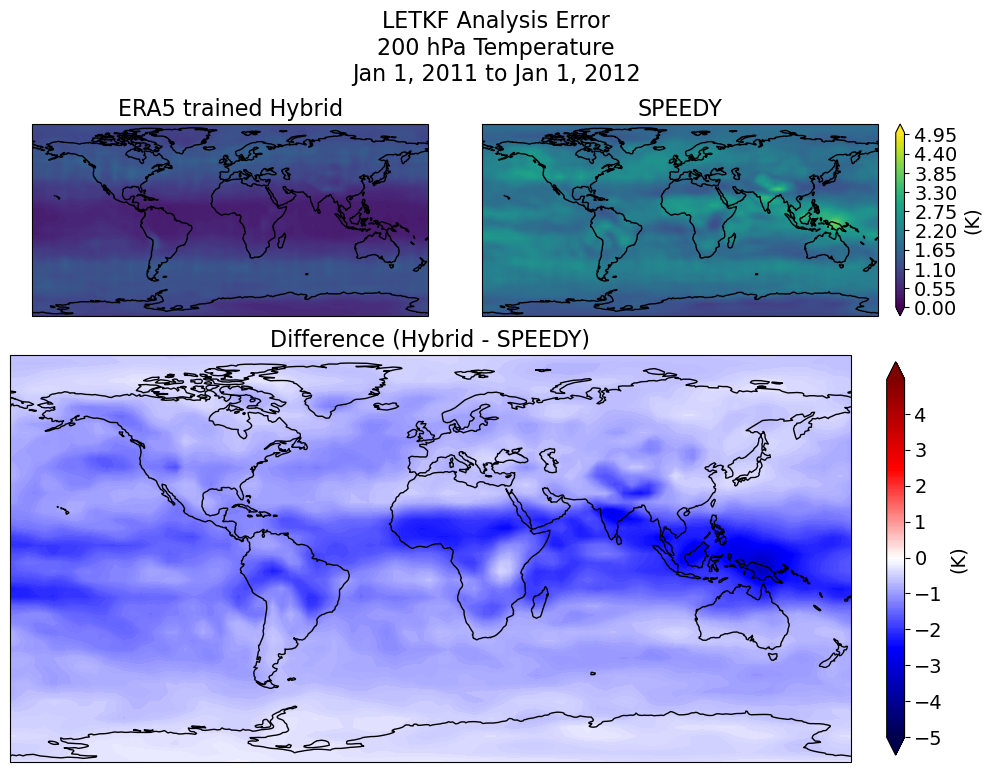

looping through hybrid 1.3,1.3 ..
Map_of_level_0.2_variable_t_hybrid_speedy.png


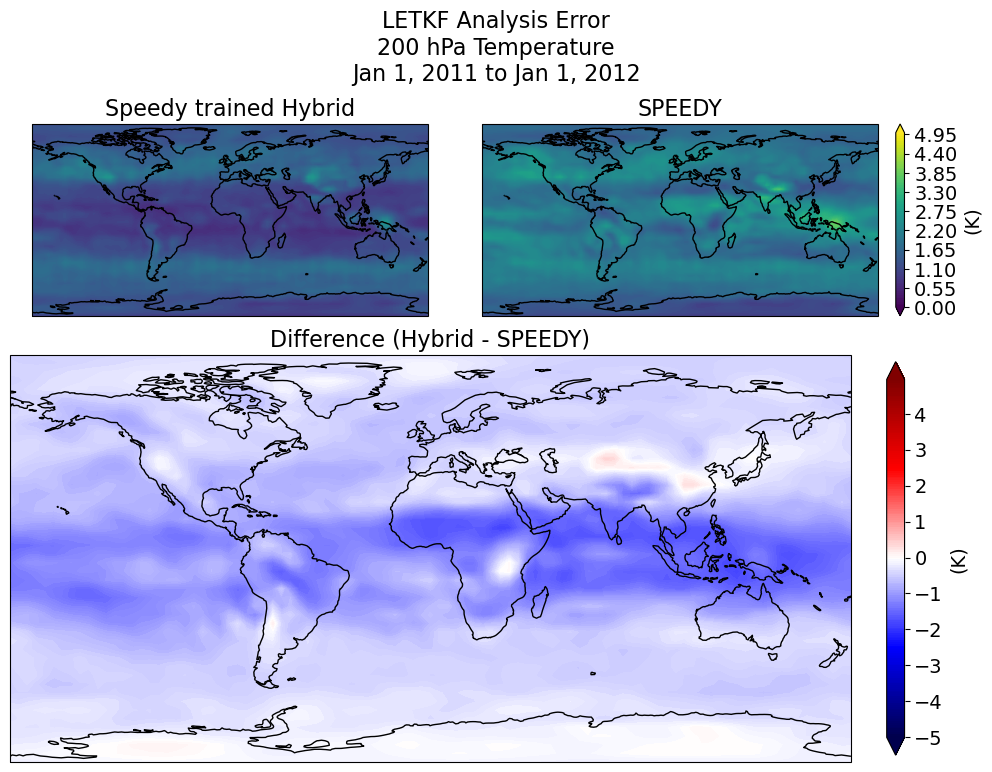

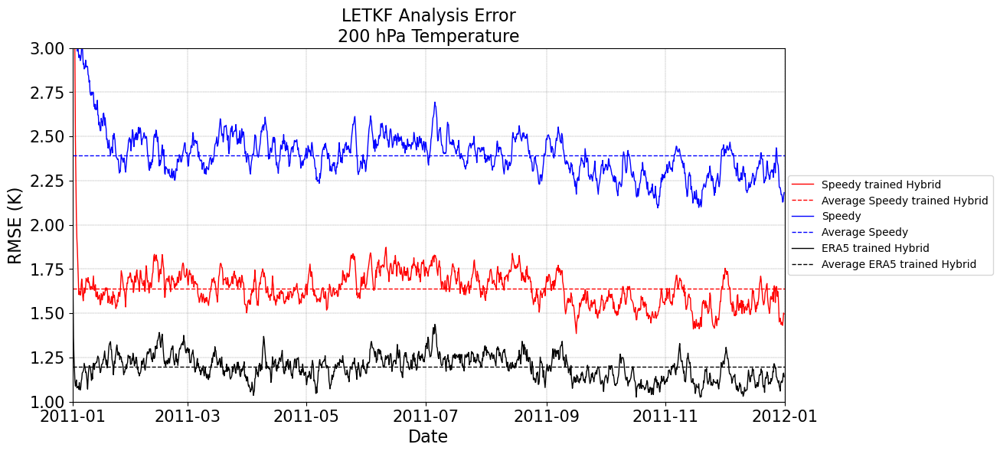

V-wind
you selected for variable = V-wind
at level = 0.2
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = V-wind
at level = 0.2
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(m/s)
Meridional Wind
Map_of_level_0.2_variable_v_ERA5.png


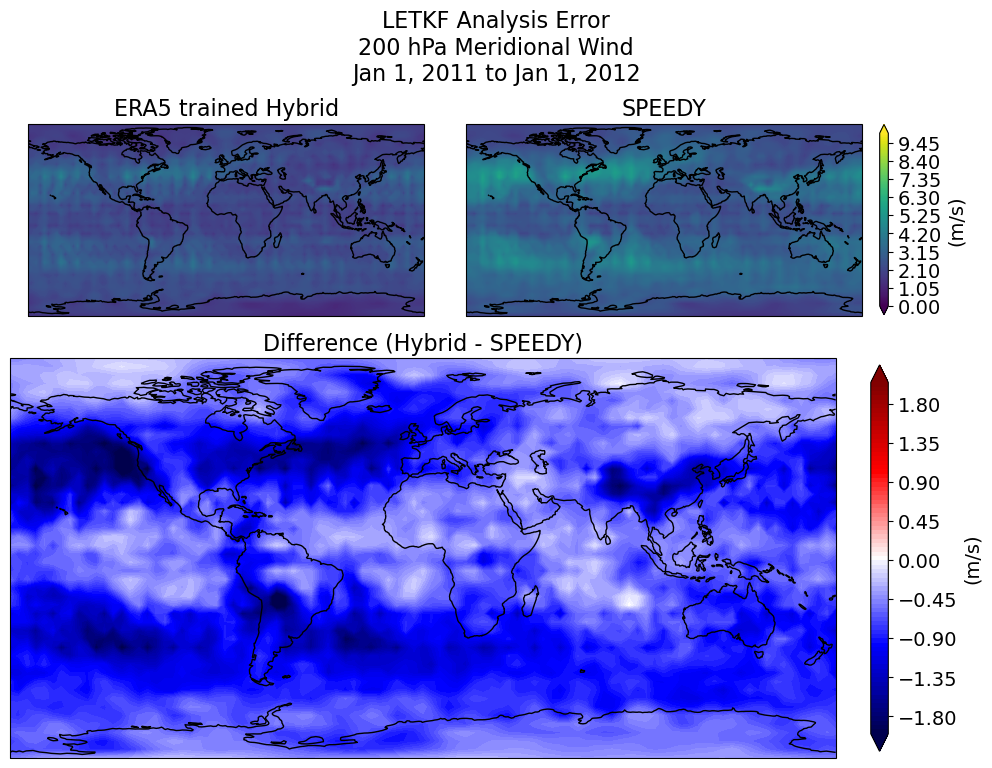

looping through hybrid 1.3,1.3 ..
Map_of_level_0.2_variable_v_hybrid_speedy.png


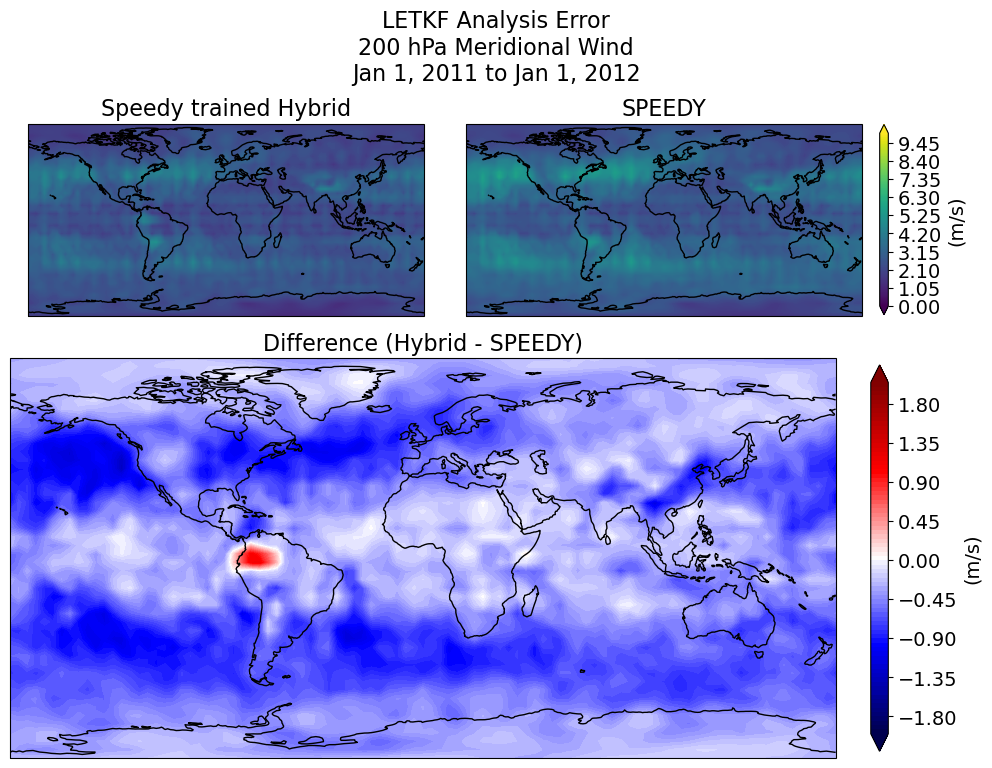

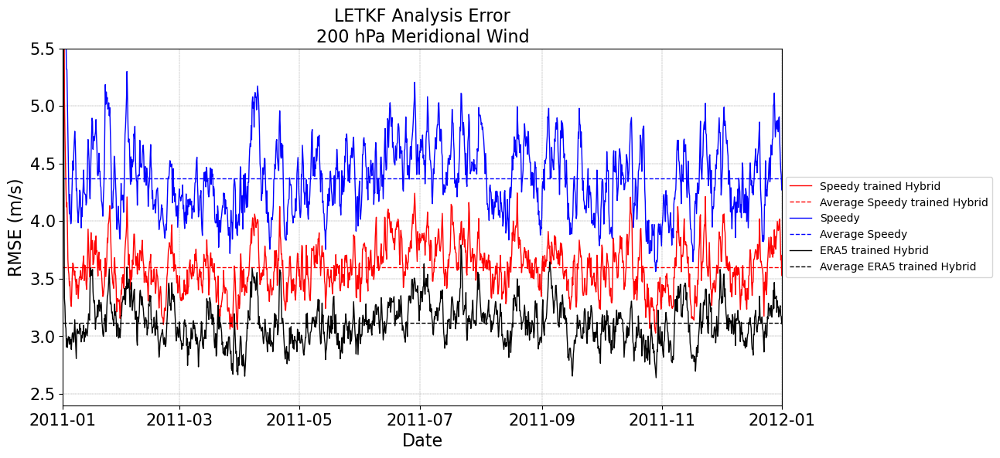

Specific_Humidity
you selected for variable = Specific_Humidity
at level = 0.2
made it to the for loop...
LOADING DATA...
Now its concatinating them all together...
Done concat and sortby Timestep...
era5 shape =  (1460, 48, 96)
speedy shape =  (1460, 48, 96)
hybrid shape =  (1460, 48, 96)
the smallest length is 1460
(1460, 48, 96)
(1460, 48, 96)
Now its calculating analysis RMSE...
DONE CALCULATING ERROR AT EVERY GRIDPOINT AT EVERY TIMESTEP
Done.
you selected for variable = Specific_Humidity
at level = 0.2
MAKING zeros arrays..
Done with analysis.
Now plotting and meshing...
(g/kg)
Specific Humidity
Map_of_level_0.2_variable_q_ERA5.png


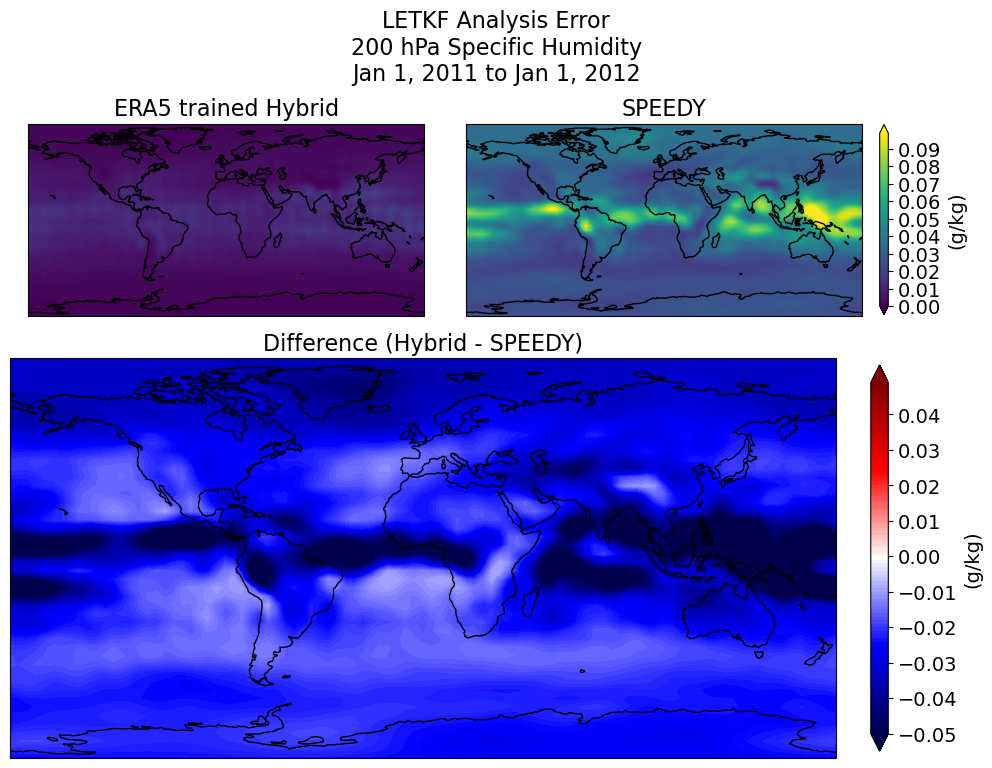

looping through hybrid 1.3,1.3 ..
Map_of_level_0.2_variable_q_hybrid_speedy.png


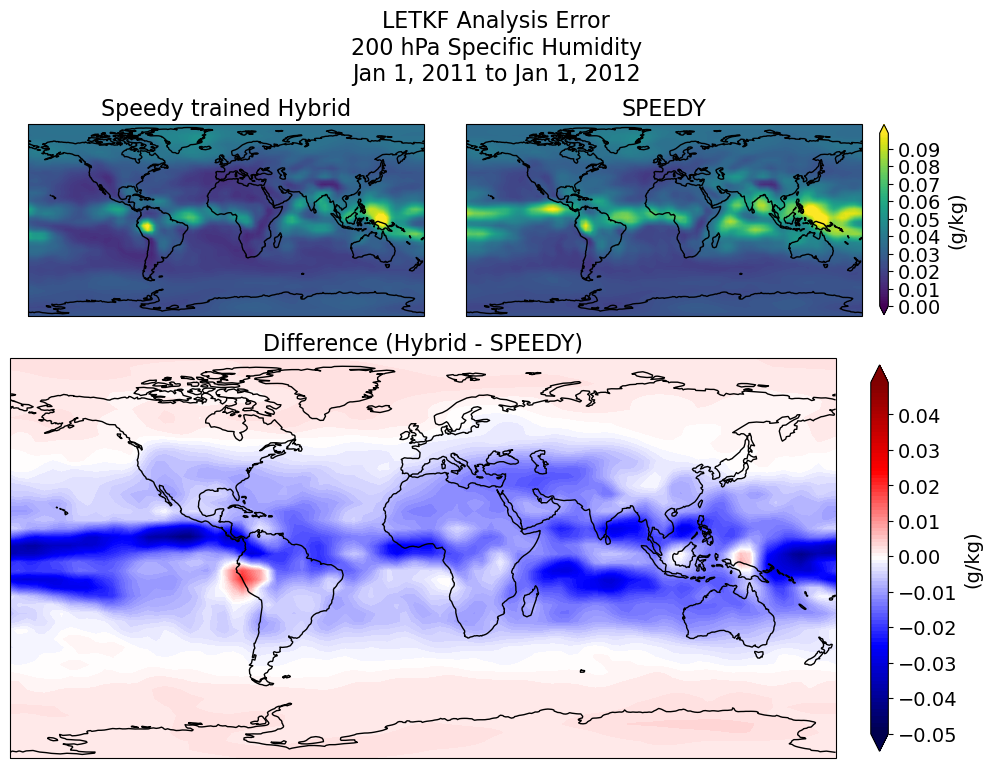

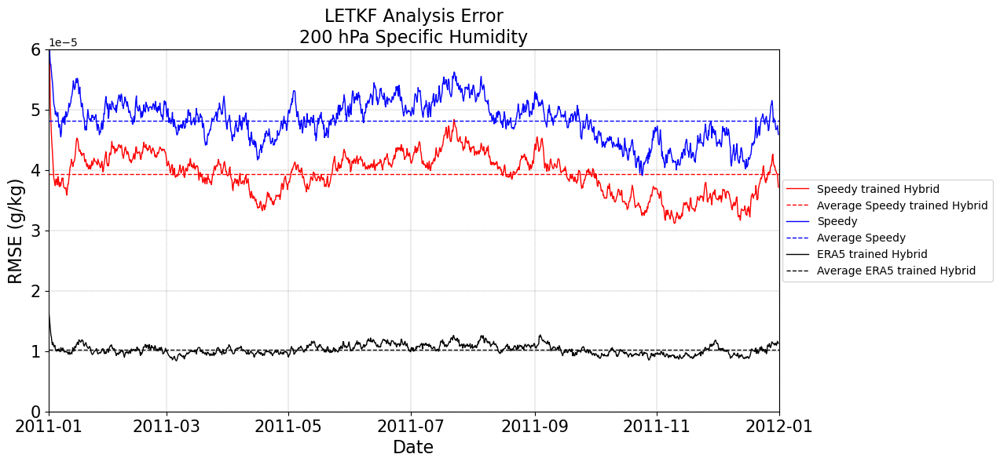

In [9]:
## works!
## need to change file and dates in function above before running this cell


## LOOP THROUGH FUNCTION

# FUNCTION INPUTS

level_list_speedy = [.95,.2]
variable_list_speedy = ['u','t','v','q']

points = ['ocean_west_of_mexico','land_mexico','ocean_west_of_africa','land_africa','persian_gulf']

for level in level_list_speedy:
    for variable in variable_list_speedy:
        for point in points:
            rmse_time_series_plot_and_maps(level,variable,point)

